In [1]:
import os
import re
import sys
import glob
import time
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

from matplotlib.colors import LogNorm

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
import matplotlib

# Set Palatino as the serif font
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif']  = 'Palatino'

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
plt.rcParams["figure.figsize"] = 7.5, 4.5
plt.rcParams["font.size"]      = 12

In [6]:
fav_col = '#418094'

In [7]:
filename = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-11_25_2024-file.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

## PMT veto analysis

In [8]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/'

all_chs = range(13)

def extract_date_obj_and_number(filename):
    match       = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    date_str    = match.group(1)
    file_number = int(match.group(2))
    date_obj    = datetime.strptime(date_str, "%m_%d_%Y")
    return date_obj, file_number

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

In [9]:
files        = glob.glob('/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_pmt_analysis_max_run-*.npz')
sorted_files = sorted(files, key=extract_date_obj_and_number)

max_vals_dict = {}
idx_vals_dict = {}
all_chs = range(13)

for filename in sorted_files:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    if date not in max_vals_dict:
        print(date)
        max_vals_dict[date] = {ch: d['max_vals_dict'].item()[ch] for ch in all_chs}
        idx_vals_dict[date] = {ch: d['idx_vals_dict'].item()[ch] for ch in all_chs}

    else:
        for ch in all_chs:
            try:
                max_vals_dict[date][ch] = np.concatenate((max_vals_dict[date][ch], d['max_vals_dict'].item()[ch]))
                idx_vals_dict[date][ch] = np.concatenate((idx_vals_dict[date][ch], d['idx_vals_dict'].item()[ch]))
                
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

09_10_2024
09_11_2024
09_12_2024
09_20_2024
09_25_2024
09_28_2024
10_04_2024
10_11_2024
10_17_2024
10_25_2024
11_01_2024
11_11_2024
11_25_2024
12_13_2024
12_21_2024
01_02_2025
01_10_2025
01_19_2025


In [10]:
max_vals_pmt = np.concatenate([max_vals_dict[date][12] for date in max_vals_dict.keys()])
idx_vals_pmt = np.concatenate([idx_vals_dict[date][12] for date in idx_vals_dict.keys()])

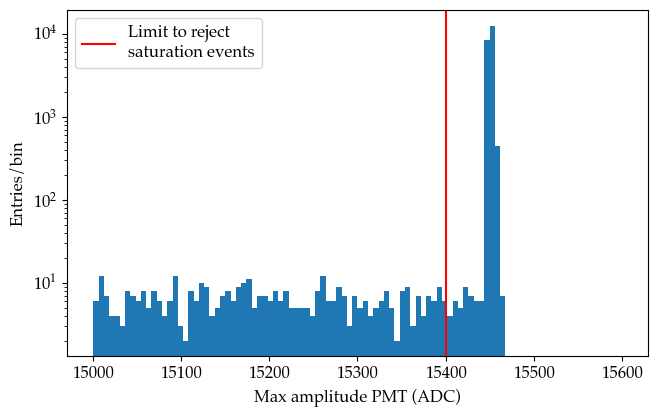

In [11]:
plt.hist(max_vals_pmt, bins=100, range=(15000, 15600), log=True)
plt.axvline(15400, color='r', label='Limit to reject \nsaturation events')
plt.xlabel('Max amplitude PMT (ADC)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

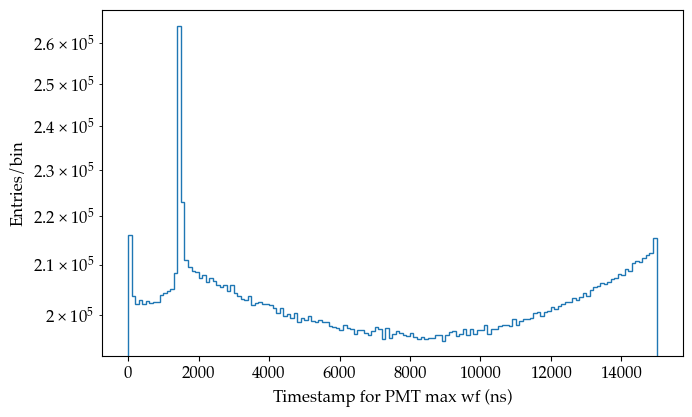

In [12]:
plt.hist(idx_vals_pmt*2, bins=150, log=True, histtype='step')
plt.xlabel('Timestamp for PMT max wf (ns)')
plt.ylabel('Entries/bin')
plt.show()

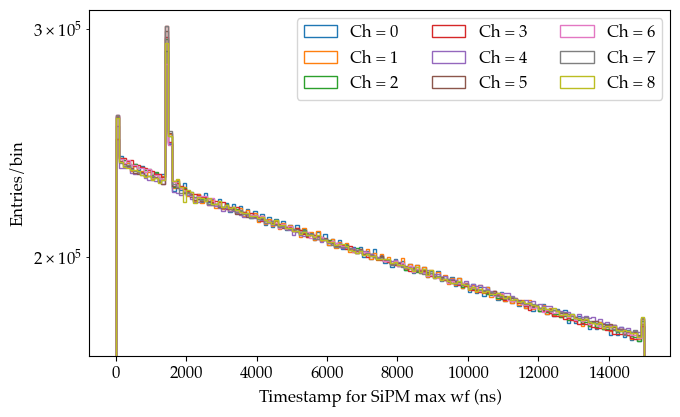

In [13]:
## SiPMs

for ch in range(9):
    idx_vals_ch = np.concatenate([idx_vals_dict[date][ch] for date in idx_vals_dict.keys()])
    plt.hist(idx_vals_ch*2, bins=150, log=True, label=f'Ch = {ch}', histtype='step')
plt.xlabel('Timestamp for SiPM max wf (ns)')
plt.ylabel('Entries/bin')
plt.legend(ncol=3)
plt.show()

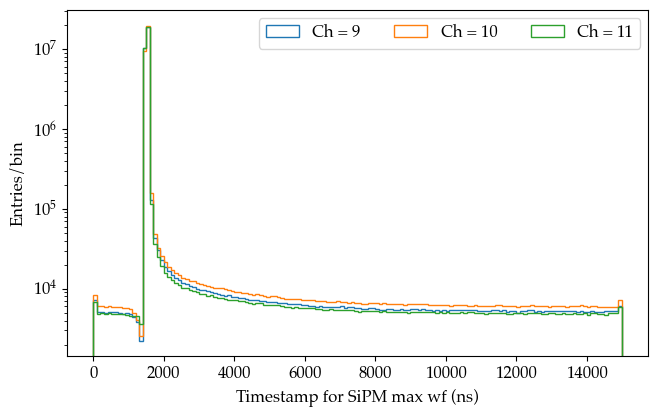

In [14]:
## Trigger SiPMs

for ch in [9, 10, 11]:
    idx_vals_ch = np.concatenate([idx_vals_dict[date][ch] for date in idx_vals_dict.keys()])
    plt.hist(idx_vals_ch*2, bins=150, log=True, label=f'Ch = {ch}', histtype='step')
plt.xlabel('Timestamp for SiPM max wf (ns)')
plt.ylabel('Entries/bin')
plt.legend(ncol=3)
plt.show()

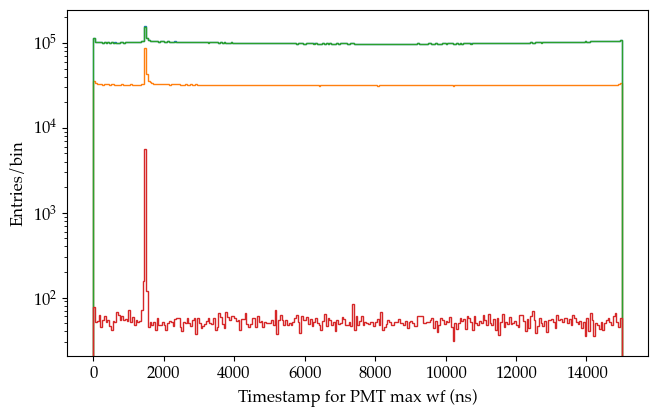

In [15]:
sel1 = max_vals_pmt >   100
sel2 = max_vals_pmt < 15400
sel3 = max_vals_pmt[sel1][max_vals_pmt[sel1] > 15400]

plt.hist(idx_vals_pmt*2,       bins=300, log=True, histtype='step', label='All wfs')
plt.hist(idx_vals_pmt[sel1]*2, bins=300, log=True, histtype='step', label='Removing baseline')
plt.hist(idx_vals_pmt[sel2]*2, bins=300, log=True, histtype='step', label='Removing saturation')
plt.hist(idx_vals_pmt[sel1][max_vals_pmt[sel1] > 15400]*2, bins=300, log=True, histtype='step', label='Removing baseline and saturation')
plt.xlabel('Timestamp for PMT max wf (ns)')
plt.ylabel('Entries/bin')
plt.show()

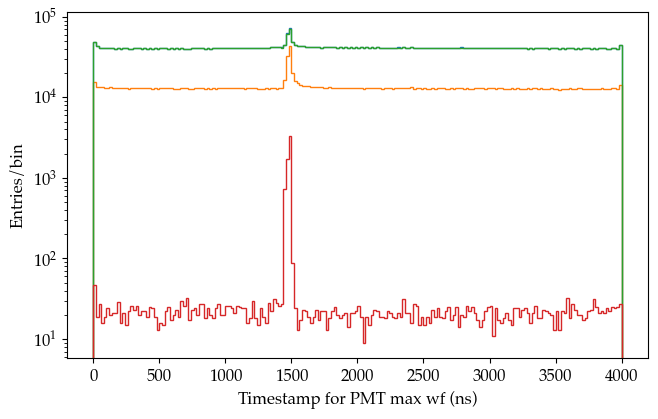

In [16]:
sel1 = max_vals_pmt >   100
sel2 = max_vals_pmt < 15400
sel3 = max_vals_pmt[sel1][max_vals_pmt[sel1] > 15400]

plt.hist(idx_vals_pmt*2,       bins=200, range=(0, 4000), log=True, histtype='step', label='All wfs')
plt.hist(idx_vals_pmt[sel1]*2, bins=200, range=(0, 4000), log=True, histtype='step', label='Removing baseline')
plt.hist(idx_vals_pmt[sel2]*2, bins=200, range=(0, 4000), log=True, histtype='step', label='Removing saturation')
plt.hist(idx_vals_pmt[sel1][max_vals_pmt[sel1] > 15400]*2, bins=200, range=(0, 4000), log=True, histtype='step', label='Removing baseline and saturation')
plt.xlabel('Timestamp for PMT max wf (ns)')
plt.ylabel('Entries/bin')
plt.show()

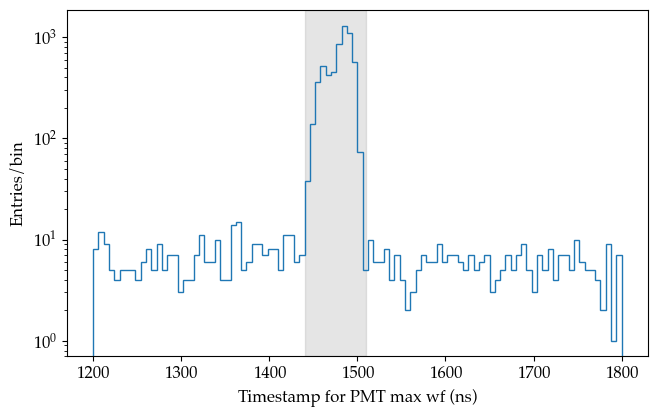

In [17]:
plt.hist(idx_vals_pmt[sel1][max_vals_pmt[sel1] > 15400]*2, bins=100, range=(1200, 1800), log=True, histtype='step')
plt.axvspan(1440, 1510, color='grey', alpha=0.2)
plt.xlabel('Timestamp for PMT max wf (ns)')
plt.ylabel('Entries/bin')
plt.show()

#### Look at the amplitude of such region

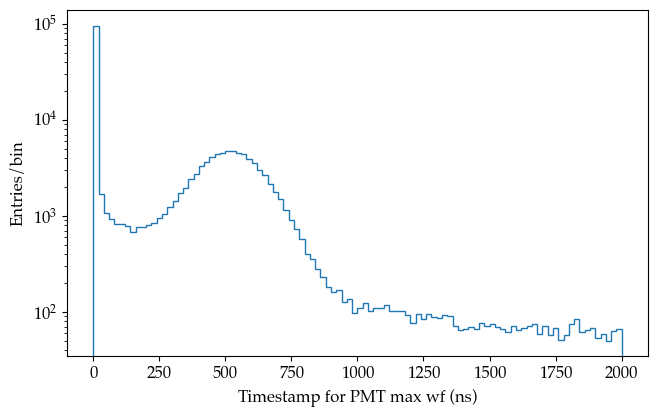

In [18]:
max_vals_pmt = np.concatenate([max_vals_dict[date][12] for date in max_vals_dict.keys()])
idx_vals_pmt = np.concatenate([idx_vals_dict[date][12] for date in idx_vals_dict.keys()])
max_vals_pmt[max_vals_pmt > 15400] = 0

plt.hist(max_vals_pmt[(idx_vals_pmt > 1440/2)&(idx_vals_pmt < 1510/2)&(max_vals_pmt!=0)], bins=100, range=(0, 2000), histtype='step', log=True)
plt.xlabel('Timestamp for PMT max wf (ns)')
plt.ylabel('Entries/bin')
plt.show()

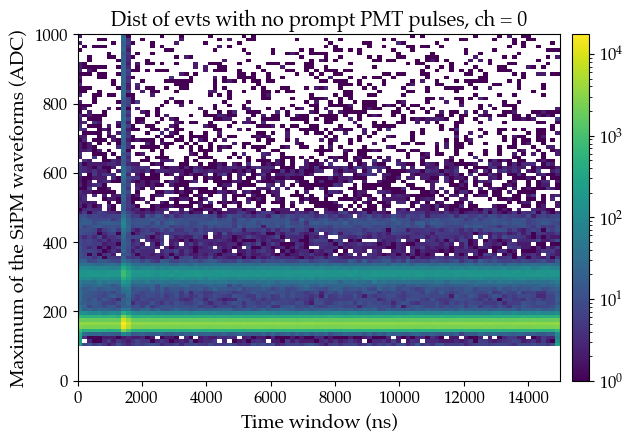

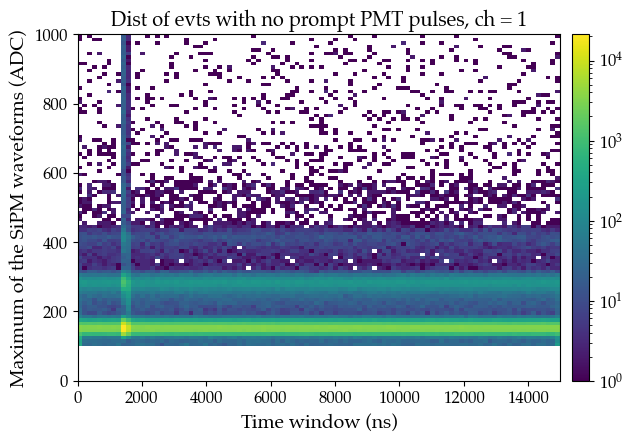

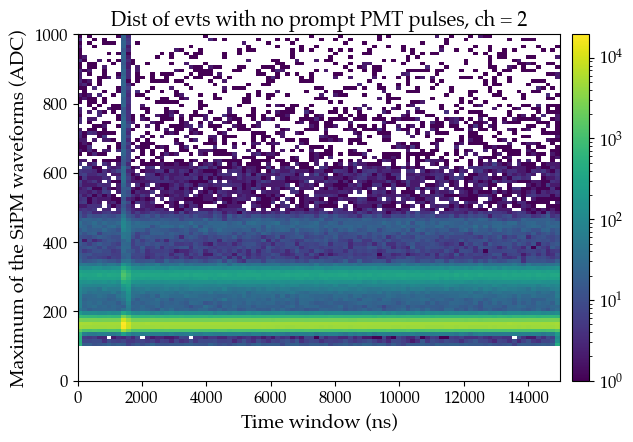

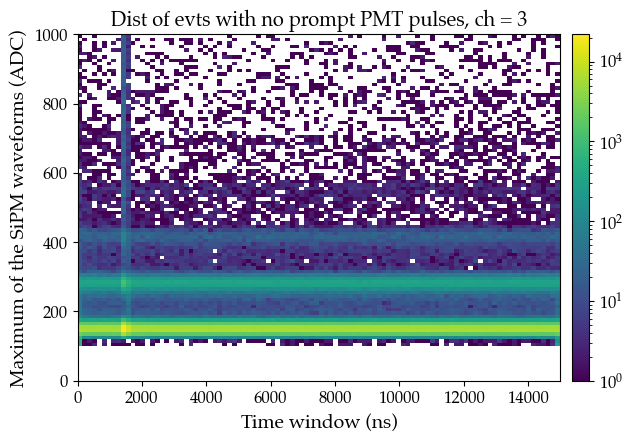

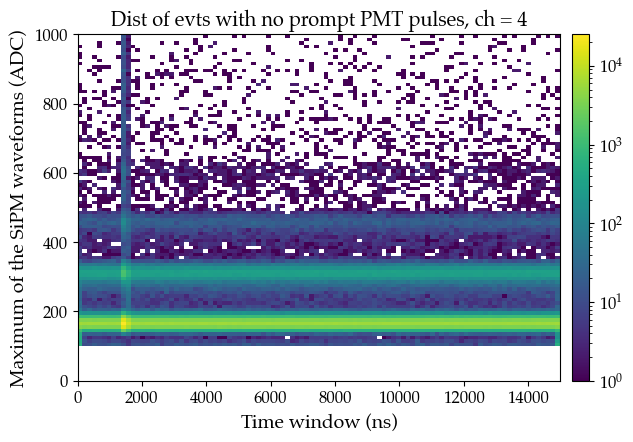

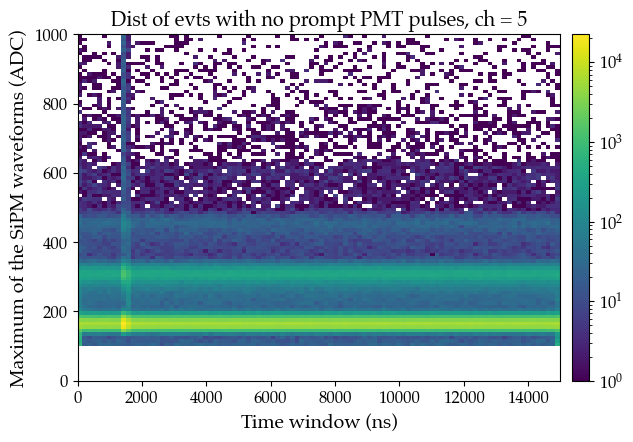

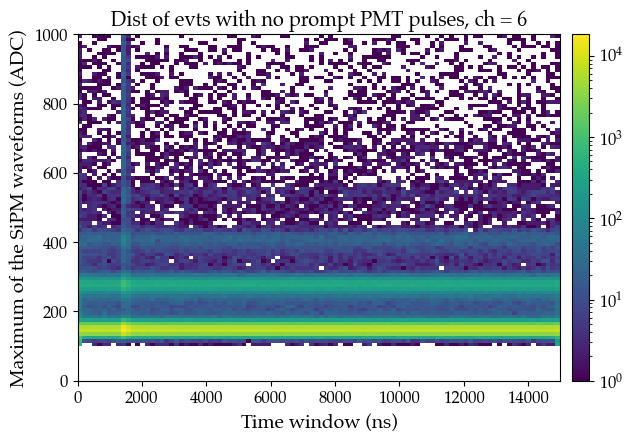

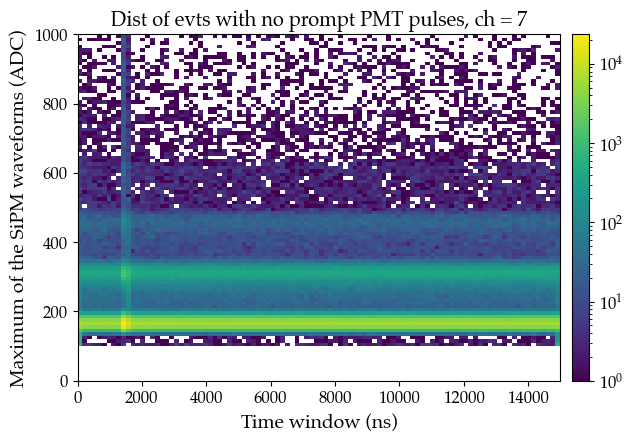

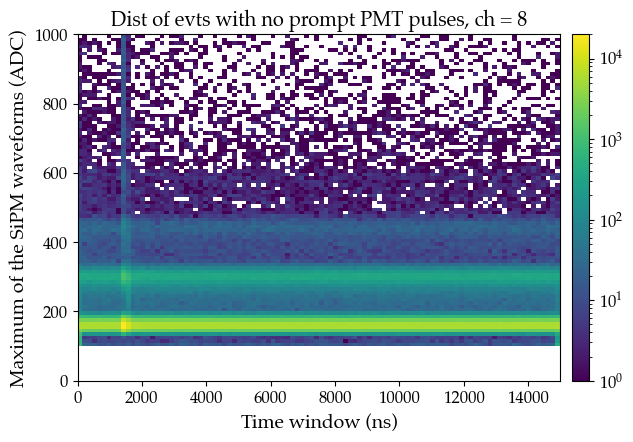

In [19]:
max_vals_pmt[max_vals_pmt > 15400] = 0
max_vals_pmt[(idx_vals_pmt > 1440/2)&(idx_vals_pmt < 1510/2)] = 0

for ch in range(9):
    max_vals_ch = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
    max_vals_ch[max_vals_ch < 100] = 0

    veto_pmt = (max_vals_pmt != 0) & (max_vals_ch != 0)
    
    mvals = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
    ivals = np.concatenate([idx_vals_dict[date][ch] for date in max_vals_dict.keys()])
    plt.hist2d(2*ivals[veto_pmt], mvals[veto_pmt], bins=(100, 100), range=((0, 15000), (0, 1000)), cmin=1, norm=LogNorm())
    plt.title(f'Dist of evts with no prompt PMT pulses, ch = {ch}')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Maximum of the SiPM waveforms (ADC)', fontsize=14)
    plt.colorbar(pad=0.02)
    plt.show()

### Remember how was the case with no cuts

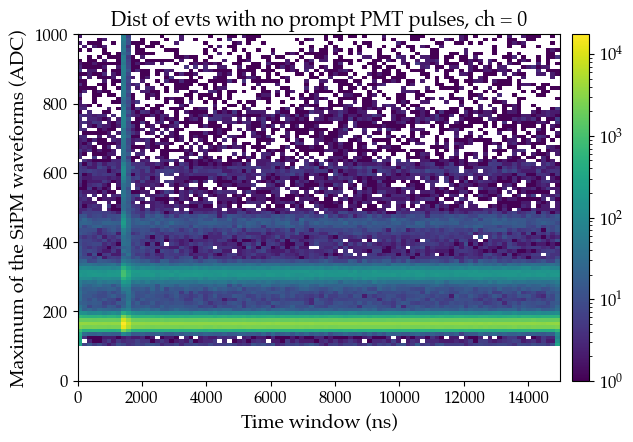

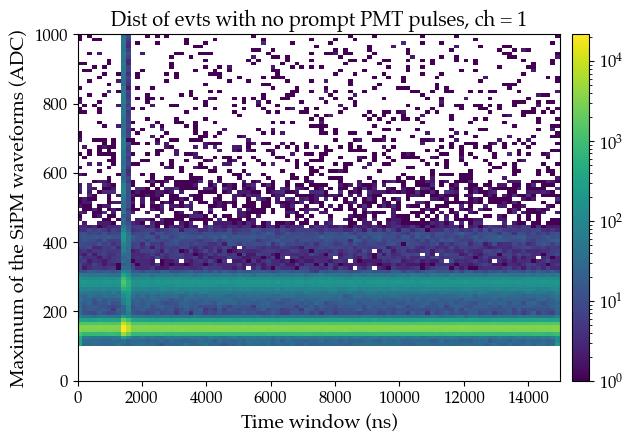

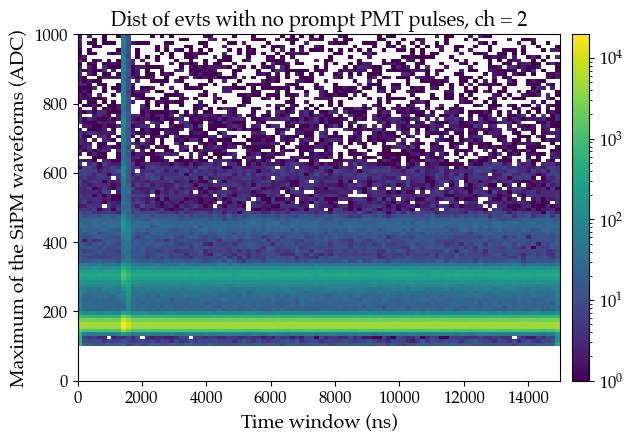

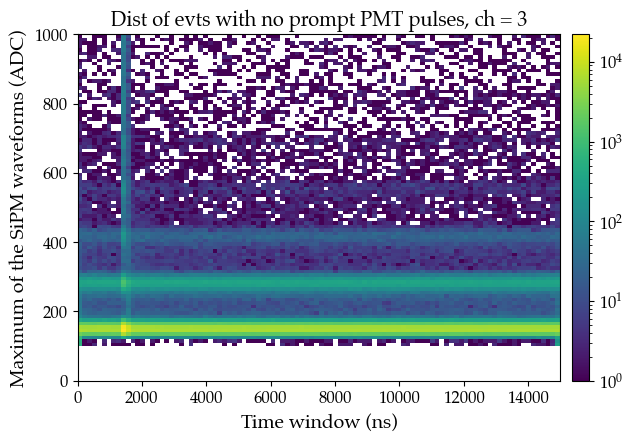

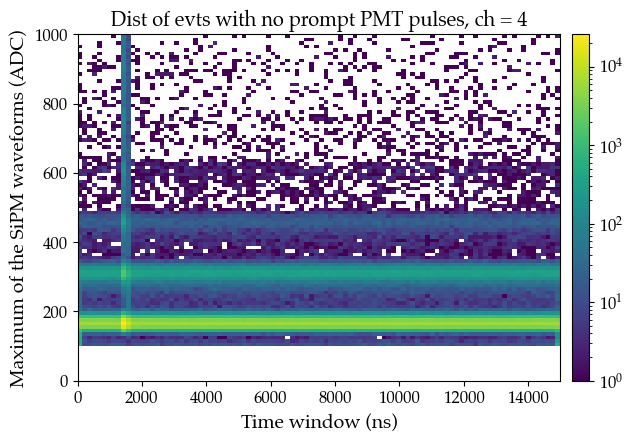

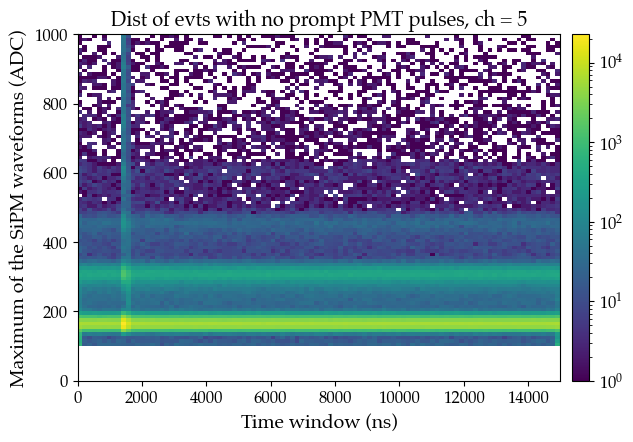

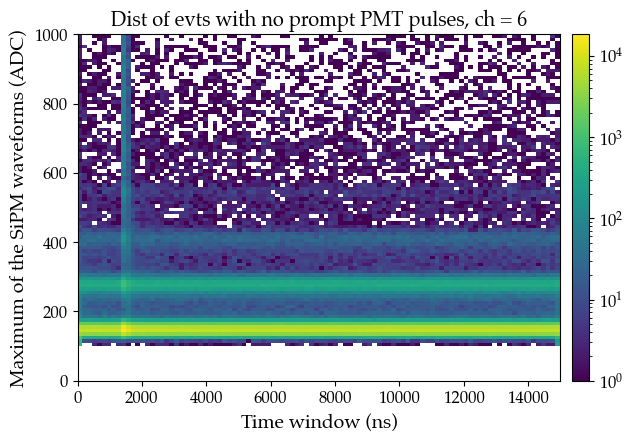

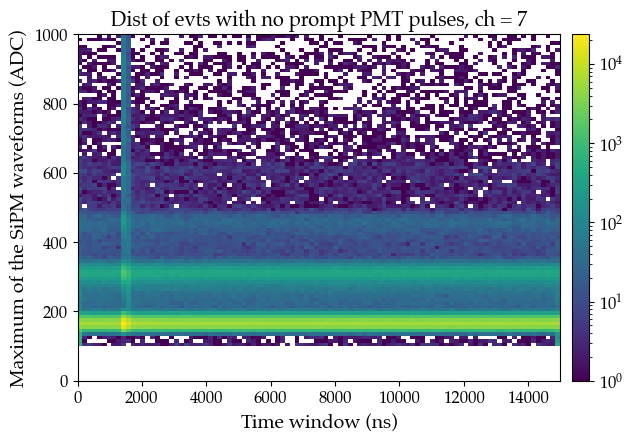

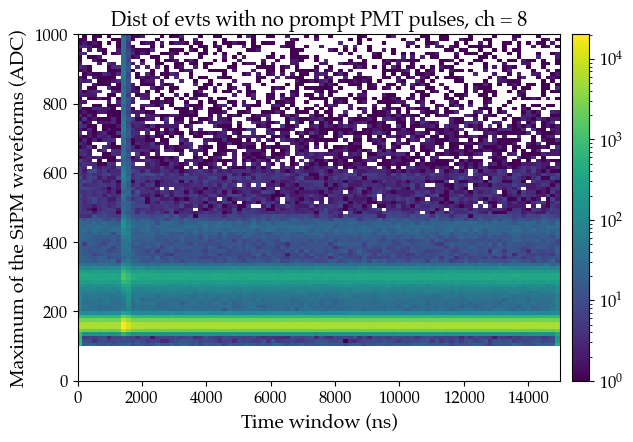

In [20]:
for ch in range(9):
    max_vals_ch = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
    max_vals_ch[max_vals_ch < 100] = 0
    
    sel_ampl_ab_100 = max_vals_ch != 0
    
    mvals = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
    ivals = np.concatenate([idx_vals_dict[date][ch] for date in max_vals_dict.keys()])
    plt.hist2d(2*ivals[sel_ampl_ab_100], mvals[sel_ampl_ab_100], bins=(100, 100), range=((0, 15000), (0, 1000)), cmin=1, norm=LogNorm())
    plt.title(f'Dist of evts with no prompt PMT pulses, ch = {ch}')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Maximum of the SiPM waveforms (ADC)', fontsize=14)
    plt.colorbar(pad=0.02)
    plt.show()

### Time distribution

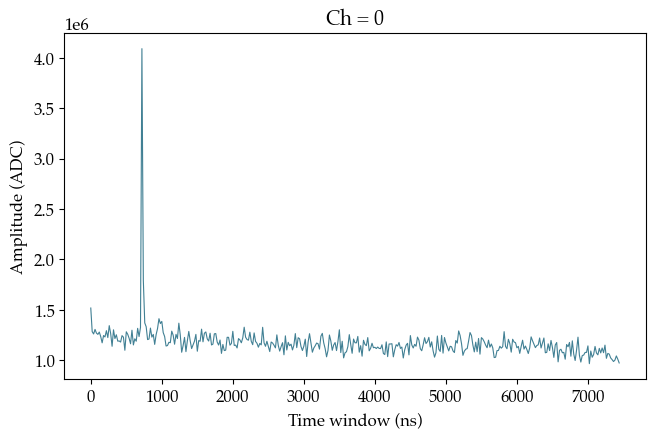

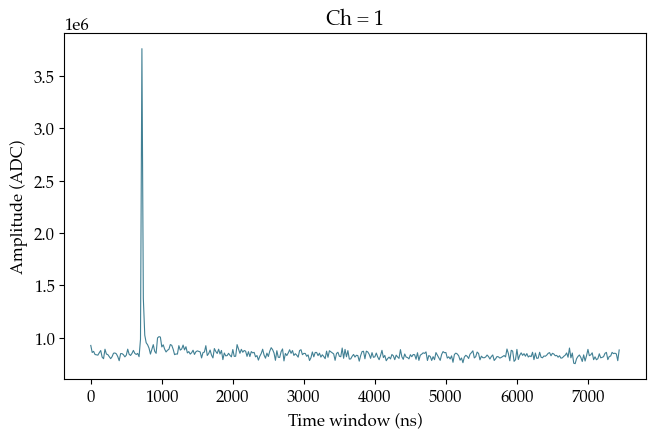

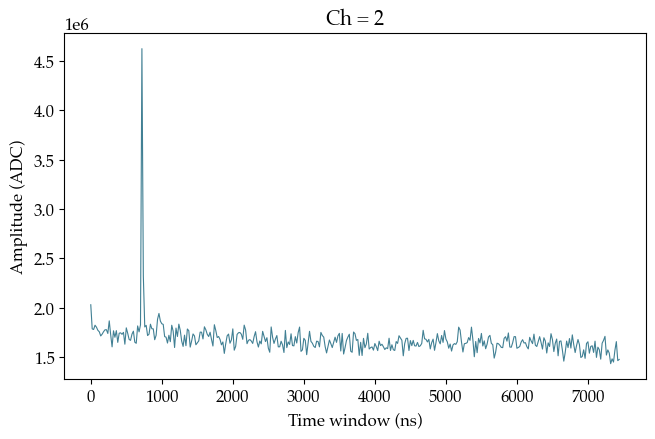

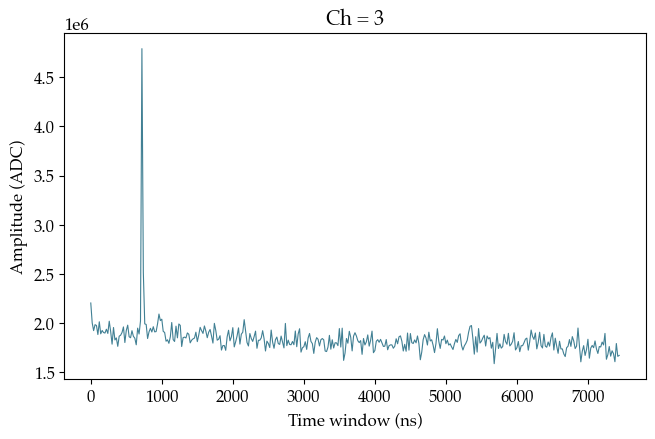

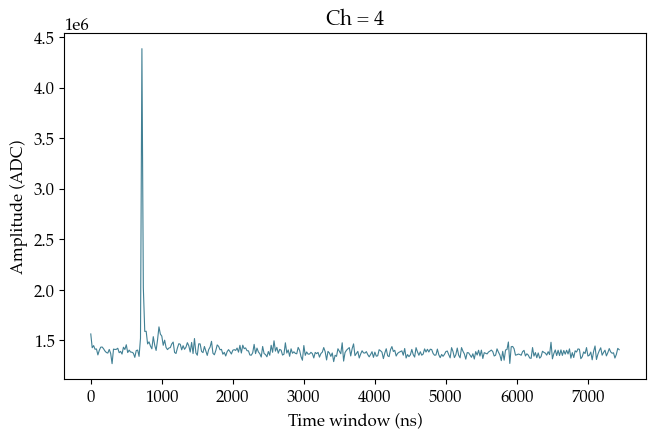

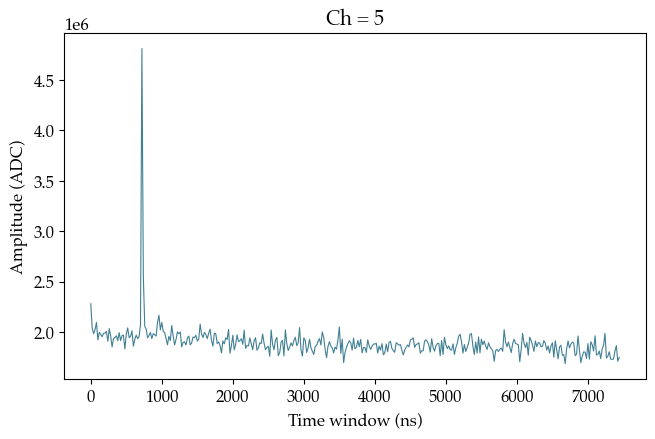

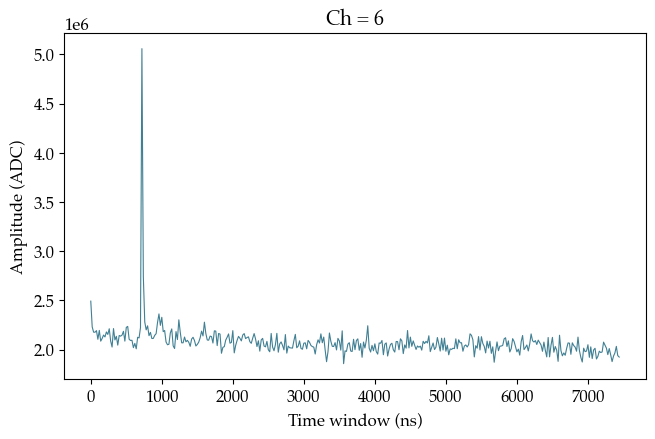

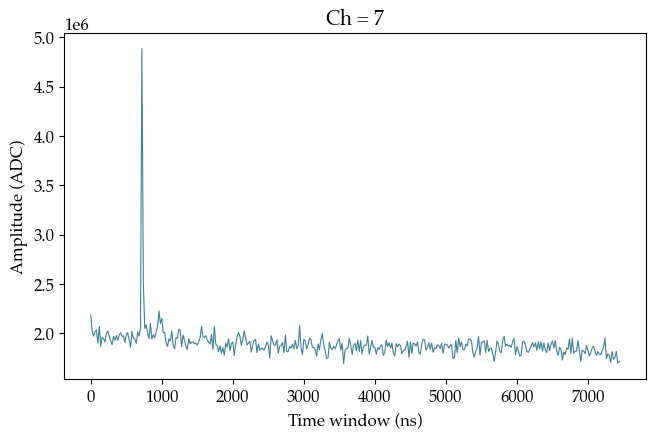

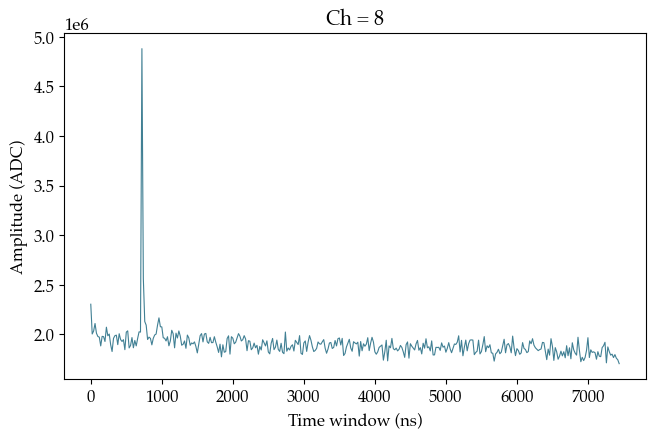

In [21]:
bin_size   = 20 #t sample, 40 ns

max_vals_pmt[max_vals_pmt > 15400] = 0
max_vals_pmt[(idx_vals_pmt > 1440/2)&(idx_vals_pmt < 1510/2)] = 0

for ch in range(9):
    max_vals_ch = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
    max_vals_ch[max_vals_ch < 100] = 0

    veto_pmt = (max_vals_pmt != 0) & (max_vals_ch != 0)
    
    timestamps = 2*np.concatenate([idx_vals_dict[date][12] for date in max_vals_dict.keys()])[veto_pmt]
    amplitudes =   np.concatenate([max_vals_dict[date][12] for date in max_vals_dict.keys()])[veto_pmt]
    
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = np.array([np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps])
    
    reshaped = sum_amplitudes[:len(sum_amplitudes) - len(sum_amplitudes) % bin_size].reshape(-1, bin_size)
    summed   = reshaped.sum(axis=1)
    
    plt.plot(20*np.arange(len(summed)), summed, lw=0.8, c=fav_col, label='bin size = 40 ns')
    #plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=fav_col)
    plt.title(f'Ch = {ch}')
    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',  fontsize=12)
    plt.show()

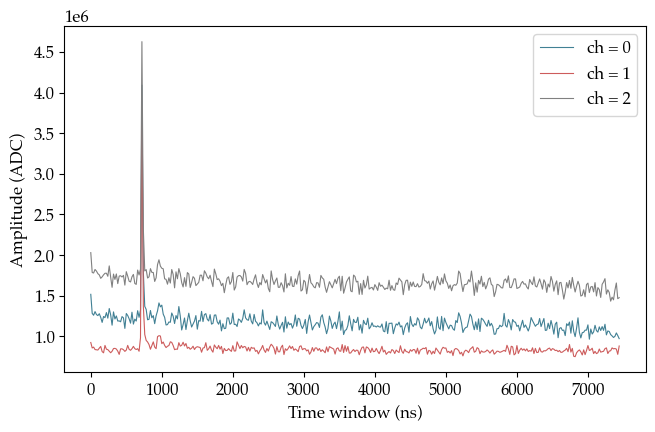

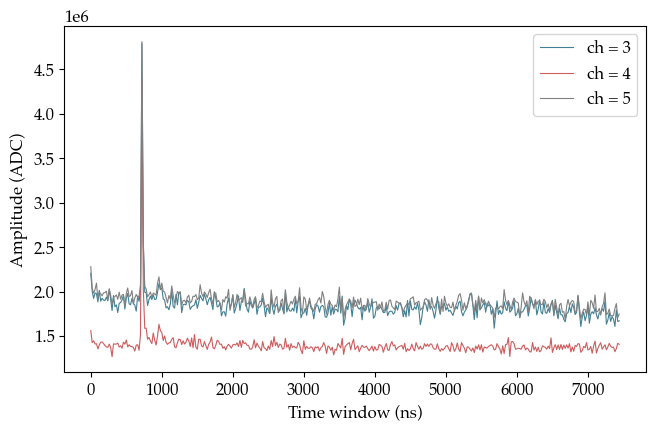

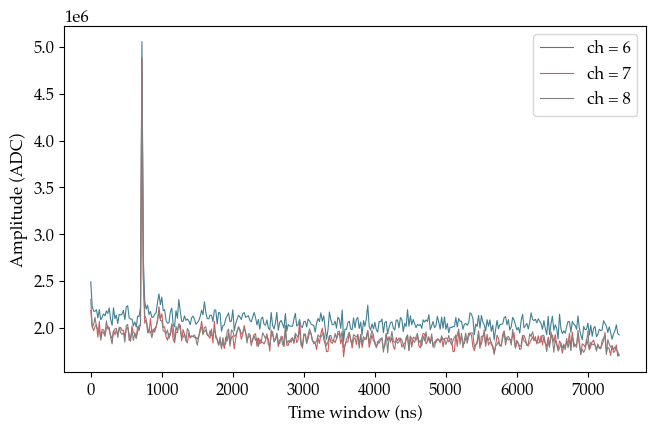

In [22]:
bin_size   = 20 #t sample, 40 ns

max_vals_pmt[max_vals_pmt > 15400] = 0
max_vals_pmt[(idx_vals_pmt > 1440/2)&(idx_vals_pmt < 1510/2)] = 0

for sel_chs in [[0, 1, 2], [3, 4, 5], [6, 7, 8]]:
    for ch,col in zip(sel_chs, [fav_col, 'indianred', 'grey']):
        max_vals_ch = np.concatenate([max_vals_dict[date][ch] for date in max_vals_dict.keys()])
        max_vals_ch[max_vals_ch < 100] = 0
    
        veto_pmt = (max_vals_pmt != 0) & (max_vals_ch != 0)
        
        timestamps = 2*np.concatenate([idx_vals_dict[date][12] for date in max_vals_dict.keys()])[veto_pmt]
        amplitudes =   np.concatenate([max_vals_dict[date][12] for date in max_vals_dict.keys()])[veto_pmt]
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = np.array([np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps])
        
        reshaped = sum_amplitudes[:len(sum_amplitudes) - len(sum_amplitudes) % bin_size].reshape(-1, bin_size)
        summed   = reshaped.sum(axis=1)
        
        plt.plot(20*np.arange(len(summed)), summed, lw=0.8, c=col, label=f'ch = {ch}')
    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',  fontsize=12)
    plt.legend()
    plt.show()

## Take the hit maps and veto with the PMT data:

In [23]:
thr_ADC        = 80
sg_filt_window = 30
min_dist       = 50

def extract_date_obj_and_number(filename):
    match       = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    date_str    = match.group(1)
    file_number = int(match.group(2))
    date_obj    = datetime.strptime(date_str, "%m_%d_%Y")
    return date_obj, file_number

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

filt_files   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_abs_vals_run-*')
sorted_files = sorted(filt_files, key=extract_date_obj_and_number)

In [24]:
### Gains to calibrate the channels
## With the trigger channels it depends on the date because there were more variations

gains_all_chs = {0: (142.951, 5.925),
                 1: (132.500, -3.333),
                 2: (135.502, 12.886),
                 3: (135.000, -5.000),
                 4: (143.315,  5.262),
                 5: (137.660, 11.814),
                 6: (130.000, 0.),
                 7: (138.123, 12.840),
                 8: (131.772, 13.920),
                 9: {'09_10_2024': (713.445, -20.038), 
                     '09_11_2024': (716.176, -19.673), 
                     '09_12_2024': (719.783, -10.151), 
                     '09_20_2024': (722.221, -11.124), 
                     '09_25_2024': (723.042, -11.830), 
                     '09_28_2024': (721.611, -12.276), 
                     '10_04_2024': (720.181, -12.722), 
                     '10_11_2024': (725.152, -12.032), 
                     '10_17_2024': (728.640, -11.851), 
                     '10_25_2024': (722.907, -12.550), 
                     '11_01_2024': (724.566, -11.215), 
                     '11_11_2024': (714.408, -12.857), 
                     '11_25_2024': (704.251, -14.499), 
                     '12_13_2024': (691.857,   2.794), 
                     '12_21_2024': (680.420,  -3.534), 
                     '01_02_2025': (671.088,   4.511), 
                     '01_10_2025': (703.052,   0.083), 
                     '01_19_2025': (707.833,  -5.059)},
                 
                 10: {'09_10_2024': (707.800, 43.580), 
                      '09_11_2024': (707.968, 44.407), 
                      '09_12_2024': (706.610, 45.092), 
                      '09_20_2024': (703.655, 53.165), 
                      '09_25_2024': (703.754, 53.722), 
                      '09_28_2024': (704.139, 52.949), 
                      '10_04_2024': (705.643, 52.823), 
                      '10_11_2024': (706.706, 53.208), 
                      '10_17_2024': (707.740, 53.039), 
                      '10_25_2024': (707.276, 53.987), 
                      '11_01_2024': (705.825, 54.078), 
                      '11_11_2024': (705.377, 53.354), 
                      '11_25_2024': (705.761, 52.763), 
                      '12_13_2024': (709.026, 53.851), 
                      '12_21_2024': (709.094, 55.053), 
                      '01_02_2025': (709.721, 55.118), 
                      '01_10_2025': (710.348, 55.183), 
                      '01_19_2025': (711.481, 54.422)},
                 
                 11: {'09_10_2024': (641.030, 48.974), 
                      '09_11_2024': (642.714, 47.617), 
                      '09_12_2024': (645.527, 48.325), 
                      '09_20_2024': (648.580, 45.411), 
                      '09_25_2024': (651.633, 42.497), 
                      '09_28_2024': (651.651, 42.437), 
                      '10_04_2024': (652.104, 42.815), 
                      '10_11_2024': (652.307, 42.757), 
                      '10_17_2024': (652.510, 42.698), 
                      '10_25_2024': (641.258, 60.174), 
                      '11_01_2024': (647.961, 51.403), 
                      '11_11_2024': (654.665, 42.632), 
                      '11_25_2024': (656.109, 43.477), 
                      '12_13_2024': (656.052, 44.115), 
                      '12_21_2024': (655.995, 44.754), 
                      '01_02_2025': (655.938, 45.393), 
                      '01_10_2025': (655.881, 46.032), 
                      '01_19_2025': (656.365, 44.774)}}

In [25]:
start_time = time.time()

filt_evts_dict = {}
idx_max        = {}
idx_thr        = {}
height_sg      = {}

trigg_evts_dict = {}
idx_max_trigg   = {}
height_sg_trigg = {}

normal_chs  = range(9)
trigger_chs = [9, 10, 11]

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict:
        print(date)
        filt_evts_dict[date] = {ch: d['filt_evts_dict'] .item()[ch] for ch in normal_chs}
        idx_max       [date] = {ch: d['idx_peaks_max']  .item()[ch] for ch in normal_chs}
        idx_thr       [date] = {ch: d['idx_peaks_thr']  .item()[ch] for ch in normal_chs}
        height_sg     [date] = {ch: (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0] for ch in normal_chs}
    else:
        for ch in normal_chs:
            try:
                filt_evts_dict[date][ch] = np.concatenate((filt_evts_dict[date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_max       [date][ch] = np.concatenate((idx_max       [date][ch], d['idx_peaks_max']  .item()[ch]))
                idx_thr       [date][ch] = np.concatenate((idx_thr       [date][ch], d['idx_peaks_thr']  .item()[ch]))
                height_sg     [date][ch] = np.concatenate((height_sg     [date][ch], (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

                
    if date not in idx_max_trigg:
        print(date)
        trigg_evts_dict[date] = {ch: np.arange(len(d['idx_peaks_max_trigg'].item()[9])) for ch in trigger_chs}
        idx_max_trigg  [date] = {ch: d['idx_peaks_max_trigg']   .item()[ch] for ch in trigger_chs}
        height_sg_trigg[date] = {ch: (d['height_peaks_sg_trigg'].item()[ch]-gains_all_chs[ch][date][1])/gains_all_chs[ch][date][0] for ch in trigger_chs}
    else:
        for ch in trigger_chs:
            try:
                trigg_evts_dict[date][ch] = np.concatenate((trigg_evts_dict[date][ch], adapt_evt_id(np.arange(len(d['idx_peaks_max_trigg'].item()[9])), fnum)))
                idx_max_trigg  [date][ch] = np.concatenate((idx_max_trigg  [date][ch], d['idx_peaks_max_trigg']  .item()[ch]))
                height_sg_trigg[date][ch] = np.concatenate((height_sg_trigg[date][ch], (d['height_peaks_sg_trigg'].item()[ch]-gains_all_chs[ch][date][1])/gains_all_chs[ch][date][0]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1379
0
09_10_2024
09_10_2024
09_11_2024
09_11_2024
20
40
09_12_2024
09_12_2024
60
09_20_2024
09_20_2024
80
100
120
140
160
09_25_2024
09_25_2024
180
200
220
09_28_2024
09_28_2024
240
260
280
10_04_2024
10_04_2024
300
320
340
360
10_04_2024 79 /Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_hits_and_times_thr80_mean_w30_dist50_abs_vals_run-10_04_2024-file_79.npz 1 all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)
10_04_2024 79 /Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/BACoN_run3_hits_and_times_thr80_mean_w30_dist50_abs_vals_run-10_04_2024-file_79.npz 3 all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 2 dimension(s)
10_11_2024
10_11_2024
380
400
420
440
460
10_17_2024
10_17_2024
480
500
520
540
560
10_25_2024
10_25_2024
580
600
620
640
11_01_2024
11_01_2024
660
680
700
720
11_11_2

In [26]:
len(idx_thr['11_25_2024'][0]), len(height_sg['11_25_2024'][0])

(167433, 167433)

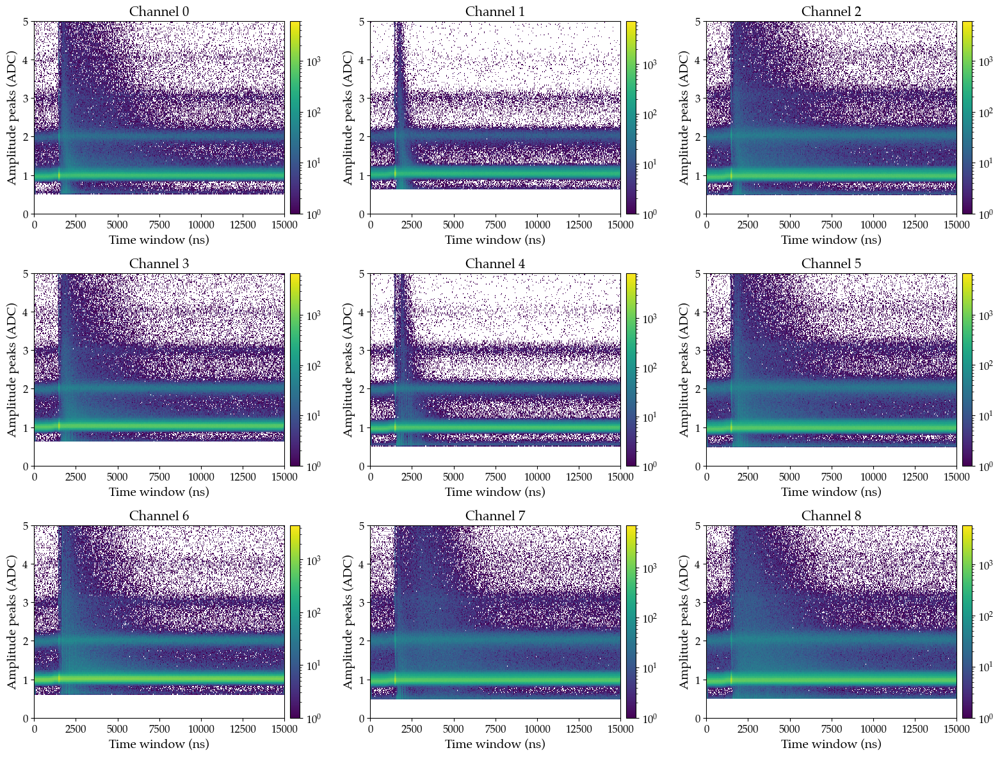

In [27]:
sel_dates = idx_max.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 5)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

6
3
0


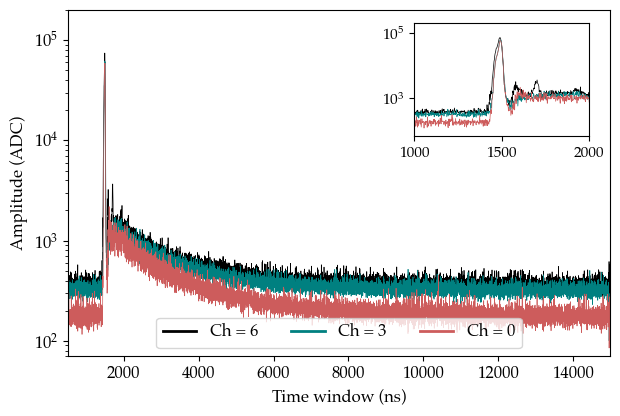

7
4
1


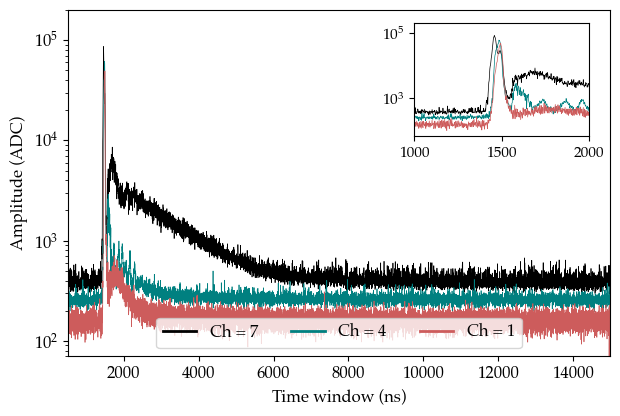

8
5
2


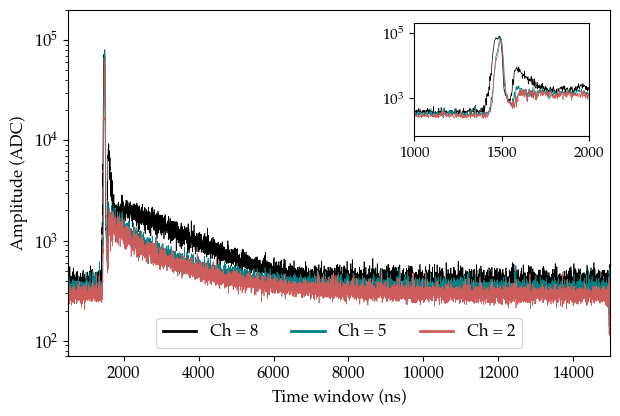

In [28]:
sel_dates = idx_max.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
        amplitudes =   np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(7e1, 2e5)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
        amplitudes =   np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)
        
    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(7e1, 2e5)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

6
3
0


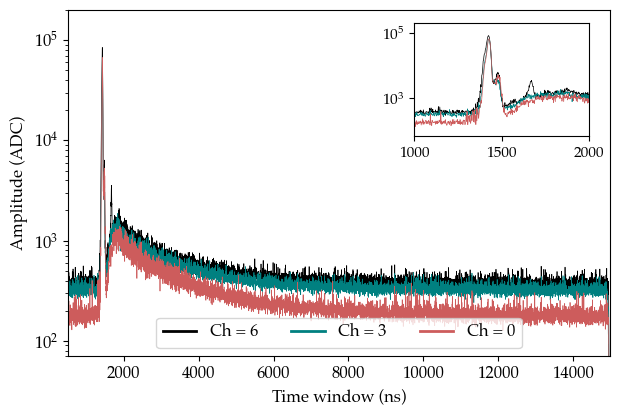

7
4
1


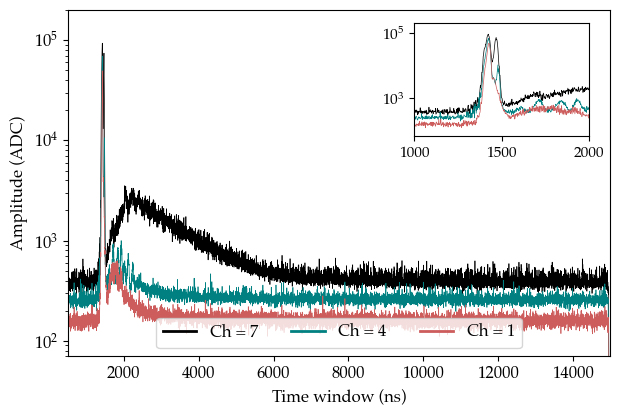

8
5
2


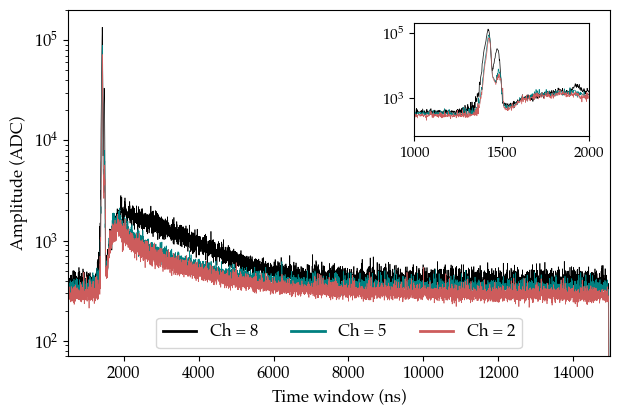

In [29]:
sel_dates = idx_thr.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([np.concatenate(idx_thr  [date][ch]) for date in sel_dates])
        amplitudes =   np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(7e1, 2e5)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([np.concatenate(idx_thr  [date][ch]) for date in sel_dates])
        amplitudes =   np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)
        
    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(7e1, 2e5)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

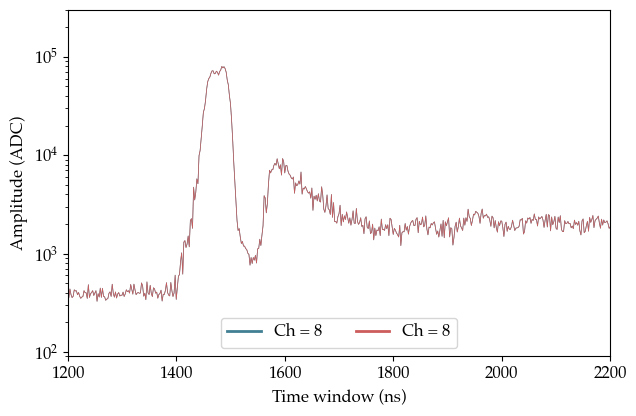

In [30]:
sel_dates = idx_max.keys()

ch  = 8
timestamps  = 2*np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates])
amplitudes  =   np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates])        
timestamps0 = 2*np.concatenate([np.concatenate(idx_thr  [date][ch]) for date in sel_dates])

unique_timestamps = np.unique(timestamps)
sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

unique_timestamps0 = np.unique(timestamps0)
sum_amplitudes0    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps0]

fig = plt.figure(figsize=(7, 4.5))
plt.plot(unique_timestamps,  sum_amplitudes,  lw=0.5, c=fav_col,     label=f'Ch = {ch}')
plt.plot(unique_timestamps0, sum_amplitudes0, lw=0.5, c='indianred', label=f'Ch = {ch}')
plt.xlabel('Time window (ns)', fontsize=12)
plt.ylabel('Amplitude (ADC)',  fontsize=12)
plt.yscale('log')
plt.xlim(1200, 2200)
plt.ylim(9e1, 3e5)
leg = plt.legend(loc='lower center', ncol=3)
for line in leg.get_lines():
    line.set_linewidth(2)
        
plt.show()

In [31]:
filt_files_test   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist25_abs_vals_ch8_run-*')
sorted_files_test = sorted(filt_files_test, key=extract_date_obj_and_number)

start_time = time.time()

filt_evts_dict_test_ch8_cal = {}
idx_max_test_ch8_cal        = {}
idx_thr_test_ch8_cal        = {}
height_sg_test_ch8_cal      = {}

print(len(sorted_files_test))
for ifile,filename in enumerate(sorted_files_test):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict_test_ch8_cal:
        print(date)
        filt_evts_dict_test_ch8_cal[date] = {ch: d['filt_evts_dict'] .item()[ch] for ch in [8]}
        idx_max_test_ch8_cal       [date] = {ch: d['idx_peaks_max']  .item()[ch] for ch in [8]}
        idx_thr_test_ch8_cal       [date] = {ch: d['idx_peaks_thr']  .item()[ch] for ch in [8]}
        height_sg_test_ch8_cal     [date] = {ch: (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0] for ch in [8]}
    else:
        for ch in [8]:
            try:
                filt_evts_dict_test_ch8_cal[date][ch] = np.concatenate((filt_evts_dict_test_ch8_cal[date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_max_test_ch8_cal       [date][ch] = np.concatenate((idx_max_test_ch8_cal       [date][ch], d['idx_peaks_max']  .item()[ch]))
                idx_thr_test_ch8_cal       [date][ch] = np.concatenate((idx_thr_test_ch8_cal       [date][ch], d['idx_peaks_thr']  .item()[ch]))
                height_sg_test_ch8_cal     [date][ch] = np.concatenate((height_sg_test_ch8_cal     [date][ch], (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1294
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
01_02_2025
1040
1060
1080
1100
1120
01_10_2025
1140
1160
1180
1200
01_19_2025
1220
1240
1260
1280
Elapsed time: 9.108443021774292 s, 0.1518073836962382 min


In [32]:
filt_files_test2   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist10_abs_vals_ch8_run-*')
sorted_files_test2 = sorted(filt_files_test2, key=extract_date_obj_and_number)

start_time = time.time()

filt_evts_dict_test_ch8_cal2 = {}
idx_max_test_ch8_cal2        = {}
idx_thr_test_ch8_cal2        = {}
height_sg_test_ch8_cal2      = {}

print(len(sorted_files_test2))
for ifile,filename in enumerate(sorted_files_test2):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict_test_ch8_cal2:
        print(date)
        filt_evts_dict_test_ch8_cal2[date] = {ch: d['filt_evts_dict'] .item()[ch] for ch in [8]}
        idx_max_test_ch8_cal2       [date] = {ch: d['idx_peaks_max']  .item()[ch] for ch in [8]}
        idx_thr_test_ch8_cal2       [date] = {ch: d['idx_peaks_thr']  .item()[ch] for ch in [8]}
        height_sg_test_ch8_cal2     [date] = {ch: (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0] for ch in [8]}
    else:
        for ch in [8]:
            try:
                filt_evts_dict_test_ch8_cal2[date][ch] = np.concatenate((filt_evts_dict_test_ch8_cal2[date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_max_test_ch8_cal2       [date][ch] = np.concatenate((idx_max_test_ch8_cal2       [date][ch], d['idx_peaks_max']  .item()[ch]))
                idx_thr_test_ch8_cal2       [date][ch] = np.concatenate((idx_thr_test_ch8_cal2       [date][ch], d['idx_peaks_thr']  .item()[ch]))
                height_sg_test_ch8_cal2     [date][ch] = np.concatenate((height_sg_test_ch8_cal2     [date][ch], (d['height_peaks_sg'].item()[ch]-gains_all_chs[ch][1])/gains_all_chs[ch][0]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1383
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
1040
1060
1080
1100
1120
01_02_2025
1140
1160
1180
1200
01_10_2025
1220
1240
1260
1280
01_19_2025
1300
1320
1340
1360
1380
Elapsed time: 10.899596929550171 s, 0.1816599488258362 min


In [33]:
filt_files_test   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist25_abs_vals_ch8_run-*')
sorted_files_test = sorted(filt_files_test, key=extract_date_obj_and_number)

start_time = time.time()

filt_evts_dict_test_ch8 = {}
idx_max_test_ch8        = {}
idx_thr_test_ch8        = {}
height_sg_test_ch8      = {}

print(len(sorted_files_test))
for ifile,filename in enumerate(sorted_files_test):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict_test_ch8:
        print(date)
        filt_evts_dict_test_ch8[date] = {ch: d['filt_evts_dict'] .item()[ch] for ch in [8]}
        idx_max_test_ch8       [date] = {ch: d['idx_peaks_max']  .item()[ch] for ch in [8]}
        idx_thr_test_ch8       [date] = {ch: d['idx_peaks_thr']  .item()[ch] for ch in [8]}
        height_sg_test_ch8     [date] = {ch: d['height_peaks_sg'].item()[ch] for ch in [8]}
    else:
        for ch in [8]:
            try:
                filt_evts_dict_test_ch8[date][ch] = np.concatenate((filt_evts_dict_test_ch8[date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                idx_max_test_ch8       [date][ch] = np.concatenate((idx_max_test_ch8       [date][ch], d['idx_peaks_max']  .item()[ch]))
                idx_thr_test_ch8       [date][ch] = np.concatenate((idx_thr_test_ch8       [date][ch], d['idx_peaks_thr']  .item()[ch]))
                height_sg_test_ch8     [date][ch] = np.concatenate((height_sg_test_ch8     [date][ch], d['height_peaks_sg'].item()[ch]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1294
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
01_02_2025
1040
1060
1080
1100
1120
01_10_2025
1140
1160
1180
1200
01_19_2025
1220
1240
1260
1280
Elapsed time: 7.655791282653809 s, 0.12759652137756347 min


In [34]:
def get_t_dist_from_hit_map(timestamps, amplitudes, bin_size=None):
    #bin_size is in time samples. bins_size=20 would be 40 ns
    unique_tmstmp = np.unique(timestamps)
    sum_ampl      = np.array([np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_tmstmp])
    if bin_size:
        reshaped = sum_ampl[:len(sum_ampl) - len(sum_ampl) % bin_size].reshape(-1, bin_size)
        sum_ampl   = reshaped.sum(axis=1)
        return bin_size*np.arange(len(sum_ampl)), sum_ampl
    else:
        return unique_tmstmp, sum_ampl

In [35]:
sel_dates = idx_max.keys()

ch  = 8

uniq_ts, sum_ampls = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_max  [date][ch]) for date in sel_dates]),
                                               np.concatenate([np.concatenate(height_sg[date][ch]) for date in sel_dates]))

uniq_ts2, sum_ampls2 = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_max_test_ch8  [date][ch]) for date in sel_dates]),
                                                 np.concatenate([np.concatenate(height_sg_test_ch8[date][ch]) for date in sel_dates]))

uniq_ts3, sum_ampls3 = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_thr_test_ch8  [date][ch]) for date in sel_dates]),
                                                 np.concatenate([np.concatenate(height_sg_test_ch8[date][ch]) for date in sel_dates]))

uniq_ts2_cal, sum_ampls2_cal = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_max_test_ch8_cal  [date][ch]) for date in sel_dates]),
                                                         np.concatenate([np.concatenate(height_sg_test_ch8_cal[date][ch]) for date in sel_dates]))

uniq_ts3_cal, sum_ampls3_cal = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_thr_test_ch8_cal  [date][ch]) for date in sel_dates]),
                                                         np.concatenate([np.concatenate(height_sg_test_ch8_cal[date][ch]) for date in sel_dates]))

uniq_ts4_cal, sum_ampls4_cal = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_max_test_ch8_cal2  [date][ch]) for date in sel_dates]),
                                                         np.concatenate([np.concatenate(height_sg_test_ch8_cal2[date][ch]) for date in sel_dates]))

uniq_ts5_cal, sum_ampls5_cal = get_t_dist_from_hit_map(2*np.concatenate([np.concatenate(idx_thr_test_ch8_cal2  [date][ch]) for date in sel_dates]),
                                                         np.concatenate([np.concatenate(height_sg_test_ch8_cal2[date][ch]) for date in sel_dates]))

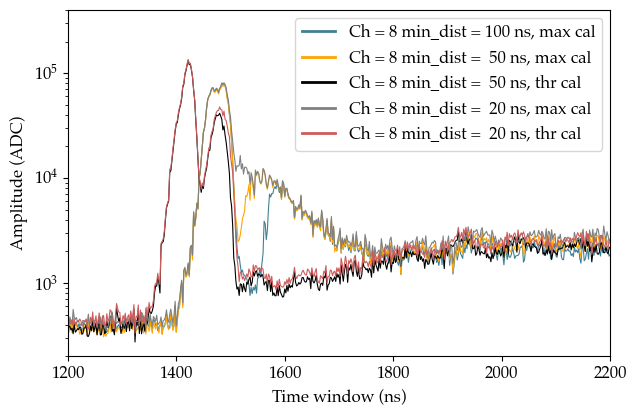

In [36]:
fig = plt.figure(figsize=(7, 4.5))
plt.plot(uniq_ts,      sum_ampls,      lw=0.8, c=fav_col,     label=f'Ch = {ch} min_dist = 100 ns, max cal')
#plt.plot(uniq_ts2,     sum_ampls2/100, lw=0.8, c='grey',      label=f'Ch = {ch} min_dist =  50 ns, max')
#plt.plot(uniq_ts3,     sum_ampls3/100, lw=0.8, c='indianred', label=f'Ch = {ch} min_dist =  50 ns, thr')
plt.plot(uniq_ts2_cal, sum_ampls2_cal,    lw=0.8, c='orange',    label=f'Ch = {ch} min_dist =  50 ns, max cal')
plt.plot(uniq_ts3_cal, sum_ampls3_cal,    lw=0.8, c='k',         label=f'Ch = {ch} min_dist =  50 ns, thr cal')
plt.plot(uniq_ts4_cal, sum_ampls4_cal,    lw=0.8, c='grey',      label=f'Ch = {ch} min_dist =  20 ns, max cal')
plt.plot(uniq_ts5_cal, sum_ampls5_cal,    lw=0.8, c='indianred', label=f'Ch = {ch} min_dist =  20 ns, thr cal')
plt.xlabel('Time window (ns)', fontsize=12)
plt.ylabel('Amplitude (ADC)',  fontsize=12)
plt.yscale('log')
plt.xlim(1200, 2200)
plt.ylim(2e2, 4e5)
leg = plt.legend(loc='upper right')
for line in leg.get_lines():
    line.set_linewidth(2)
plt.show()

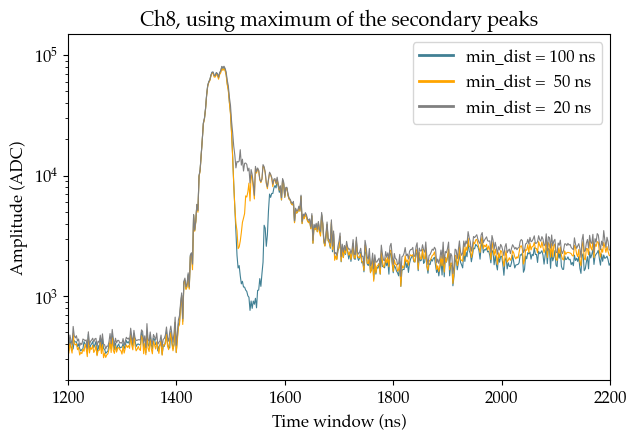

In [37]:
fig = plt.figure(figsize=(7, 4.5))
plt.plot(uniq_ts,      sum_ampls,      lw=0.8, c=fav_col,  label=f'min_dist = 100 ns')
plt.plot(uniq_ts2_cal, sum_ampls2_cal, lw=0.8, c='orange', label=f'min_dist =  50 ns')
plt.plot(uniq_ts4_cal, sum_ampls4_cal, lw=0.8, c='grey',   label=f'min_dist =  20 ns')
plt.title('Ch8, using maximum of the secondary peaks')
plt.xlabel('Time window (ns)', fontsize=12)
plt.ylabel('Amplitude (ADC)',  fontsize=12)
plt.yscale('log')
plt.xlim(1200, 2200)
plt.ylim(2e2, 1.5e5)
leg = plt.legend(loc='upper right')
for line in leg.get_lines():
    line.set_linewidth(2)
plt.show()

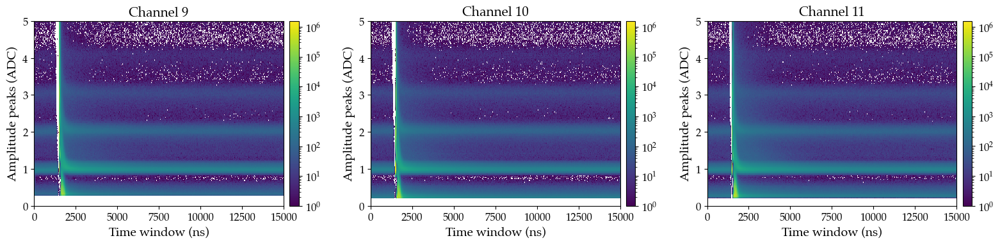

In [38]:
sel_dates = idx_max_trigg.keys()
fig, axs  = plt.subplots(1, 3, figsize=(16, 4))
for i,ch in enumerate(trigger_chs):
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_max_trigg  [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg_trigg[date][ch]) for date in sel_dates])
    
        fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 5)), cmin=1, norm=LogNorm())
        axs[i].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

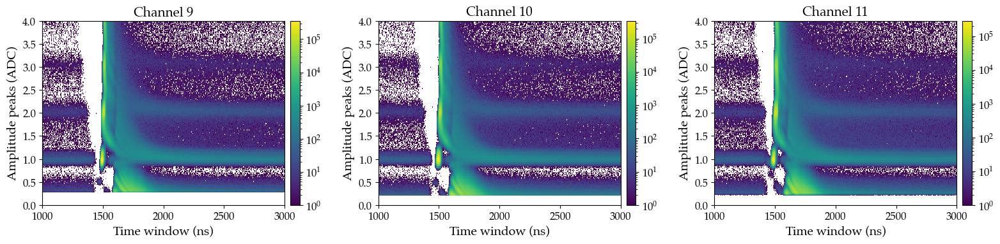

In [39]:
sel_dates = idx_max_trigg.keys()
fig, axs  = plt.subplots(1, 3, figsize=(16, 4))
for i,ch in enumerate(trigger_chs):
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_max_trigg  [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg_trigg[date][ch]) for date in sel_dates])
    
        fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 3000), (0, 4)), cmin=1, norm=LogNorm())
        axs[i].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

### Compare the trigger SiPM data with the deconv one

In [40]:
filt_files2   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_run-*')
sorted_files2 = sorted(filt_files2, key=extract_date_obj_and_number)

num_files_to_analyze = 50

start_time = time.time()

trigg_evts_dict2  = {}
idx_thr_trigg     = {}
height_sg_d_trigg = {}

print(len(sorted_files2))
for ifile,filename in enumerate(sorted_files2[:num_files_to_analyze]):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in idx_thr_trigg:
        print(date)
        trigg_evts_dict2 [date] = {ch: np.arange(len(d['idx_peaks_thr_trigg'].item()[9])) for ch in trigger_chs}
        idx_thr_trigg    [date] = {ch: d['idx_peaks_thr_trigg']   .item()[ch] for ch in trigger_chs}
        height_sg_d_trigg[date] = {ch: (d['height_peaks_sg_deconv_trigg'].item()[ch]-gains_all_chs[ch][date][1])/gains_all_chs[ch][date][0] for ch in trigger_chs}
    else:
        for ch in trigger_chs:
            try:
                trigg_evts_dict2 [date][ch] = np.concatenate((trigg_evts_dict2 [date][ch], adapt_evt_id(np.arange(len(d['idx_peaks_thr_trigg'].item()[9])), fnum)))
                idx_thr_trigg    [date][ch] = np.concatenate((idx_thr_trigg    [date][ch],  d['idx_peaks_thr_trigg']  .item()[ch]))
                height_sg_d_trigg[date][ch] = np.concatenate((height_sg_d_trigg[date][ch], (d['height_peaks_sg_deconv_trigg'].item()[ch]-gains_all_chs[ch][date][1])/gains_all_chs[ch][date][0]))
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
end_time     = time.time()                
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1380
0
09_10_2024
09_11_2024
20
40
09_12_2024
Elapsed time: 30.137784242630005 s, 0.5022964040438335 min


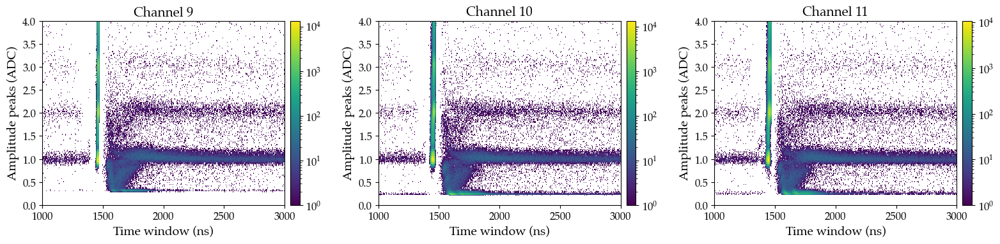

In [44]:
sel_dates = idx_thr_trigg.keys()
fig, axs  = plt.subplots(1, 3, figsize=(16, 4))
for i,ch in enumerate(trigger_chs):
    try:
        ch_idxs = np.concatenate([np.concatenate(idx_thr_trigg    [date][ch]) for date in sel_dates])
        ch_vals = np.concatenate([np.concatenate(height_sg_d_trigg[date][ch]) for date in sel_dates])
        
        fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((1000, 3000), (0, 4)), cmin=1, norm=LogNorm())
        axs[i].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
plt.show()

## Add PMT rejection to SiPM data with no cuts

In [45]:
filt_files   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_abs_vals_run-*')
sorted_files = sorted(filt_files, key=extract_date_obj_and_number)

In [46]:
start_time = time.time()

idx_thr_pv   = {} # pmt veto (pv)
idx_max_pv   = {}
height_sg_pv = {}
num_evts_pv  = {}

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    try:
        d2 = np.load(evts_path + f'BACoN_pmt_analysis_hits_run-{date}-file_{fnum}.npz', allow_pickle=True)
    except:
        continue

    pmt_evts = d2['non_zero_evts']
    pmt_idxs = d2['idx_peaks_pmt']
    pmt_heis = d2['h_peaks_pmt']
    
    ##PMT prompt evts
    condition1  = np.array([np.any((idx_vals>int(1440/2)) & (idx_vals<int(1510/2))) for idx_vals in pmt_idxs])
    prompt_evts = pmt_evts[np.where(condition1)[0]]
    
    ##Muon evts
    condition2 = np.array([np.any(h_vals>5000) for h_vals in pmt_heis])
    muon_evts  = pmt_evts[np.where(condition2)[0]]

    for ch in normal_chs:
        idx_thr_after_cut = []
        idx_max_after_cut = []
        height_after_cut  = []
        num_evts          = 0
        filt_evts_num     = d['filt_evts_dict'] .item()[ch]
        idx_peaks_thr_ch  = d['idx_peaks_thr']  .item()[ch]
        idx_peaks_max_ch  = d['idx_peaks_max']  .item()[ch]
        height_peaks_ch   = d['height_peaks_sg'].item()[ch]
        
        for evt_n, idxs, idxs2, vals in zip(filt_evts_num, idx_peaks_thr_ch, idx_peaks_max_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            if evt_n in prompt_evts:
                continue
            if evt_n in muon_evts:
                continue
            idx_thr_after_cut.append(idxs)
            idx_max_after_cut.append(idxs2)
            height_after_cut .append(vals)
            num_evts += 1
                
        if date not in idx_thr_pv:
            print(date)
            idx_thr_pv  [date] = {}
            idx_max_pv  [date] = {}
            height_sg_pv[date] = {}
            num_evts_pv [date] = {}
            
        else:

            if ch not in idx_thr_pv[date]:
                try:
                    idx_thr_pv  [date][ch] = np.concatenate(idx_thr_after_cut)
                    idx_max_pv  [date][ch] = np.concatenate(idx_max_after_cut)
                    height_sg_pv[date][ch] = np.concatenate(height_after_cut)
                    num_evts_pv [date][ch] = np.array([num_evts])
                except Exception as e:
                    print(e)
                    continue
            else:
                try:
                    idx_thr_pv  [date][ch] = np.concatenate((idx_thr_pv  [date][ch], np.concatenate(idx_thr_after_cut)))
                    idx_max_pv  [date][ch] = np.concatenate((idx_max_pv  [date][ch], np.concatenate(idx_max_after_cut)))
                    height_sg_pv[date][ch] = np.concatenate((height_sg_pv[date][ch], np.concatenate(height_after_cut)))
                    num_evts_pv [date][ch] = np.concatenate((num_evts_pv [date][ch], np.array([num_evts])))
                except Exception as e:
                    print(e)
                    continue

end_time     = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1379
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
need at least one array to concatenate
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
1040
1060
1080
1100
01_02_2025
1120
1140
1160
1180
1200
01_10_2025
1220
1240
1260
1280
01_19_2025
1300
1320
1340
1360
Elapsed time: 495.46162605285645 s, 8.257693767547607 min


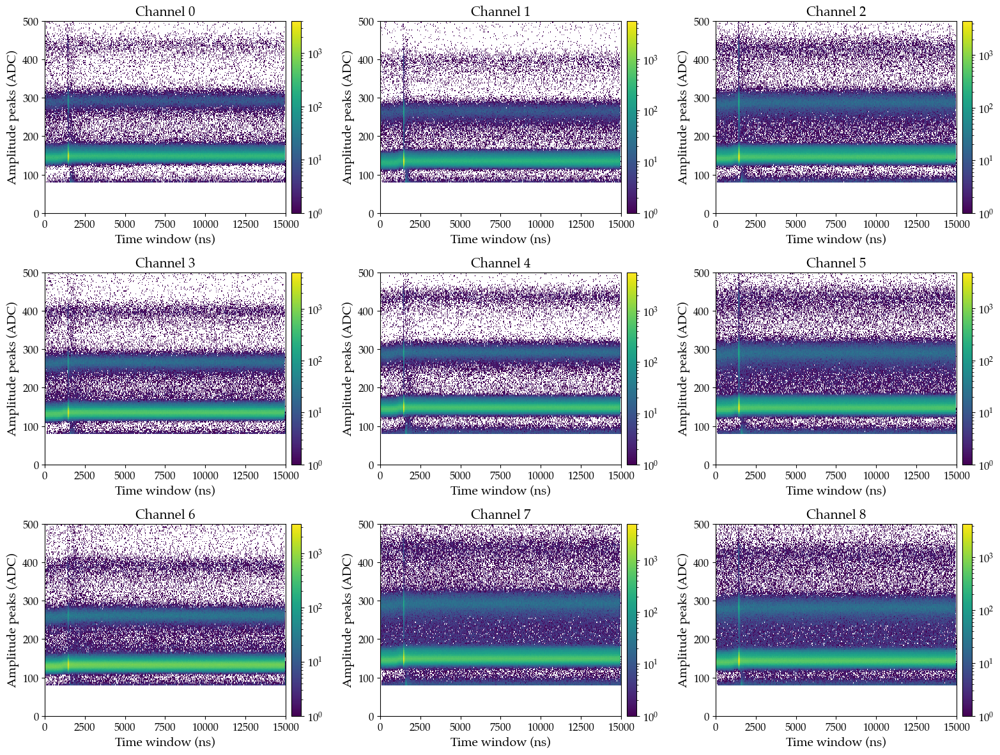

In [47]:
sel_dates = idx_thr_pv.keys()
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_thr_pv  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

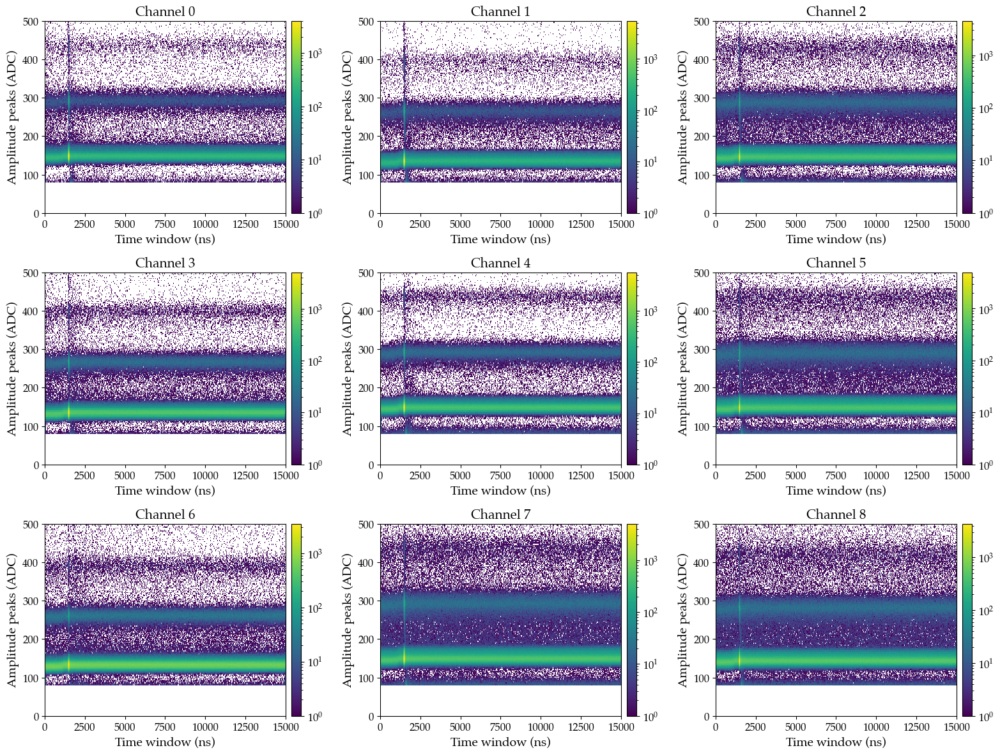

In [48]:
sel_dates = idx_max_pv.keys()
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_max_pv  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

6
3
0


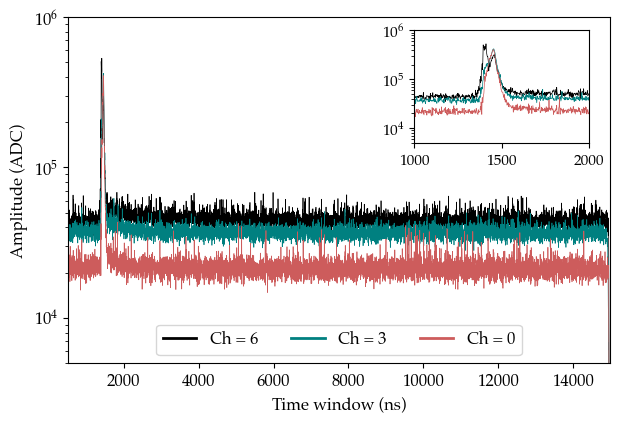

7
4
1


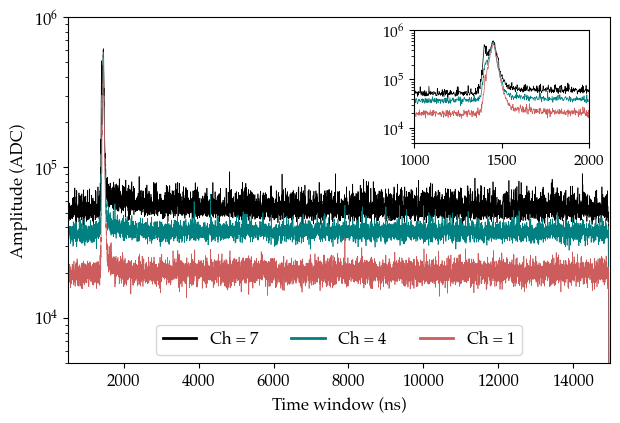

8
5
2


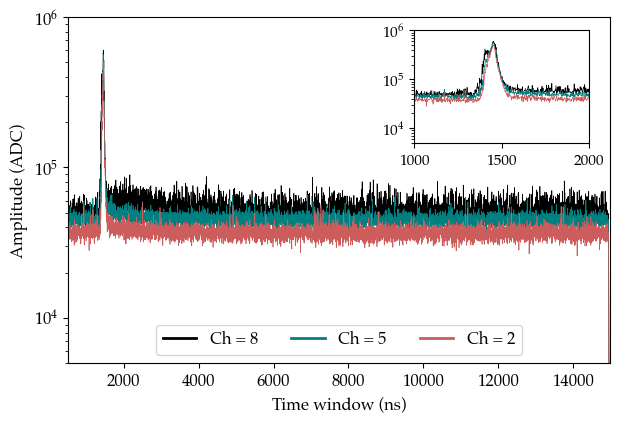

In [49]:
sel_dates = idx_thr_pv.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_thr_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(5e3, 1e6)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_thr_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)
        
        
    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(5e3, 1e6)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

6
3
0


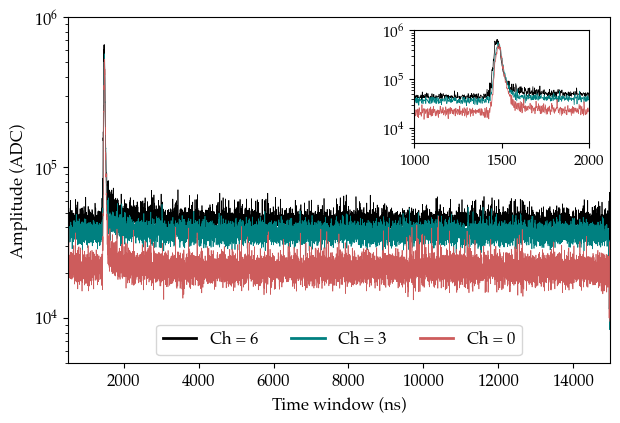

7
4
1


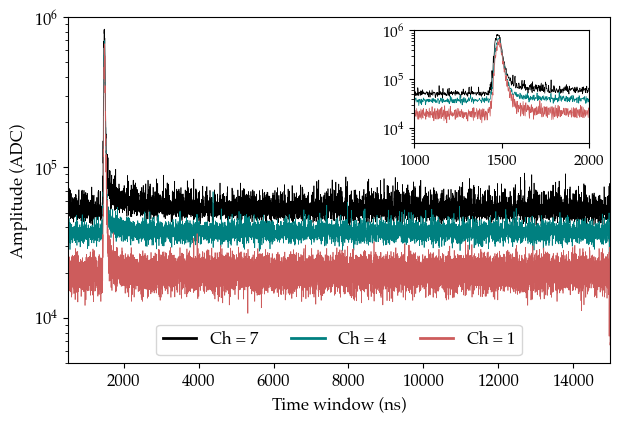

8
5
2


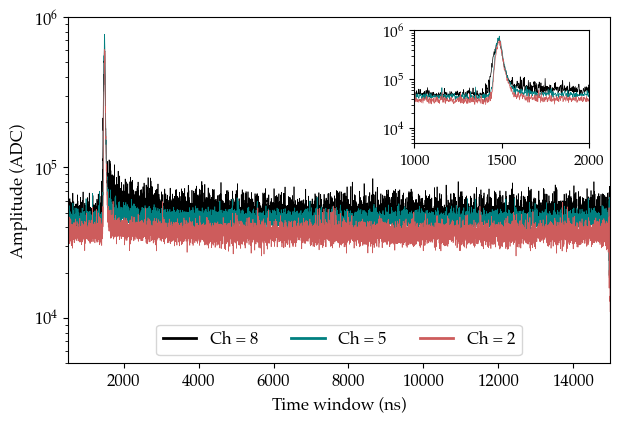

In [50]:
sel_dates = idx_max_pv.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_max_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(5e3, 1e6)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_max_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pv[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)
        
        
    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(5e3, 1e6)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

In [51]:
sel_dates = idx_max.keys()

ch  = 8

uniq_ts4, sum_ampls4 = get_t_dist_from_hit_map(2*np.concatenate([idx_thr_pv  [date][ch] for date in sel_dates]),
                                                 np.concatenate([height_sg_pv[date][ch] for date in sel_dates]))

uniq_ts5, sum_ampls5 = get_t_dist_from_hit_map(2*np.concatenate([idx_max_pv  [date][ch] for date in sel_dates]),
                                                 np.concatenate([height_sg_pv[date][ch] for date in sel_dates]))

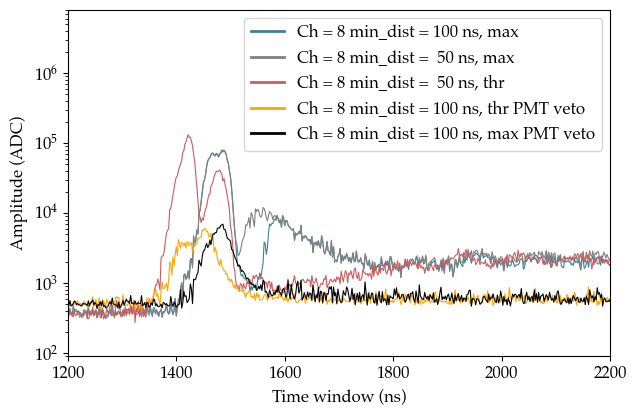

In [52]:
fig = plt.figure(figsize=(7, 4.5))
plt.plot(uniq_ts,      sum_ampls,      lw=0.8, c=fav_col,     label=f'Ch = {ch} min_dist = 100 ns, max')
plt.plot(uniq_ts2_cal, sum_ampls2_cal, lw=0.8, c='grey',      label=f'Ch = {ch} min_dist =  50 ns, max')
plt.plot(uniq_ts3_cal, sum_ampls3_cal, lw=0.8, c='indianred', label=f'Ch = {ch} min_dist =  50 ns, thr')
plt.plot(uniq_ts4,     sum_ampls4/100, lw=0.8, c='orange',    label=f'Ch = {ch} min_dist = 100 ns, thr PMT veto')
plt.plot(uniq_ts5,     sum_ampls5/100, lw=0.8, c='k',         label=f'Ch = {ch} min_dist = 100 ns, max PMT veto')
plt.xlabel('Time window (ns)', fontsize=12)
plt.ylabel('Amplitude (ADC)',  fontsize=12)
plt.yscale('log')
plt.xlim(1200, 2200)
plt.ylim(9e1, 8e6)
leg = plt.legend(loc='upper right')
for line in leg.get_lines():
    line.set_linewidth(2)
        
plt.show()

### Add PMT rejection to SiPM data with pretrigger and high light cut

In [53]:
start_time = time.time()
idx_thr_pt_hl_pv   = {} # pmt veto (pv)
idx_max_pt_hl_pv   = {}
height_sg_pt_hl_pv = {}
num_evts_pt_hl_pv  = {}

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    try:
        d2 = np.load(evts_path + f'BACoN_pmt_analysis_hits_run-{date}-file_{fnum}.npz', allow_pickle=True)
    except:
        continue
    
    pmt_evts = d2['non_zero_evts']
    pmt_idxs = d2['idx_peaks_pmt']
    pmt_heis = d2['h_peaks_pmt']
    
    ##PMT prompt evts
    condition1  = np.array([np.any((idx_vals>int(1440/2)) & (idx_vals<int(1510/2))) for idx_vals in pmt_idxs])
    prompt_evts = pmt_evts[np.where(condition1)[0]]
    
    ##Muon evts
    condition2 = np.array([np.any(h_vals>5000) for h_vals in pmt_heis])
    muon_evts  = pmt_evts[np.where(condition2)[0]]

    for ch in normal_chs:
        idx_thr_after_cut = []
        idx_max_after_cut = []
        height_after_cut  = []
        num_evts          = 0
        filt_evts_num     = d['filt_evts_dict'] .item()[ch]
        idx_peaks_thr_ch  = d['idx_peaks_thr']  .item()[ch]
        idx_peaks_max_ch  = d['idx_peaks_max']  .item()[ch]
        height_peaks_ch   = d['height_peaks_sg'].item()[ch]
        
        for evt_n, idxs, idxs2, vals in zip(filt_evts_num, idx_peaks_thr_ch, idx_peaks_max_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            if evt_n in prompt_evts:
                continue
            if evt_n in muon_evts:
                continue
            noise_evts = (np.array(idxs)<650)&(np.array(vals)>100)
            if np.any(noise_evts):
                continue
            if np.any(np.array(vals) > 1000):
                continue
            else:
                idx_thr_after_cut.append(idxs)
                idx_max_after_cut.append(idxs2)
                height_after_cut .append(vals)
                num_evts += 1
                
        if date not in idx_thr_pt_hl_pv:
            print(date)
            idx_thr_pt_hl_pv  [date] = {}
            idx_max_pt_hl_pv  [date] = {}
            height_sg_pt_hl_pv[date] = {}
            num_evts_pt_hl_pv [date] = {}
            
        else:
            if ch not in idx_thr_pt_hl_pv[date]:
                try:
                    idx_thr_pt_hl_pv  [date][ch] = np.concatenate(idx_thr_after_cut)
                    idx_max_pt_hl_pv  [date][ch] = np.concatenate(idx_max_after_cut)
                    height_sg_pt_hl_pv[date][ch] = np.concatenate(height_after_cut)
                    num_evts_pt_hl_pv [date][ch] = np.array([num_evts])
                except Exception as e:
                    print(e)
                    continue
            else:
                try:
                    idx_thr_pt_hl_pv  [date][ch] = np.concatenate((idx_thr_pt_hl_pv  [date][ch], np.concatenate(idx_thr_after_cut)))
                    idx_max_pt_hl_pv  [date][ch] = np.concatenate((idx_max_pt_hl_pv  [date][ch], np.concatenate(idx_max_after_cut)))
                    height_sg_pt_hl_pv[date][ch] = np.concatenate((height_sg_pt_hl_pv[date][ch], np.concatenate(height_after_cut)))
                    num_evts_pt_hl_pv [date][ch] = np.concatenate((num_evts_pt_hl_pv [date][ch], np.array([num_evts])))
                except Exception as e:
                    print(e)
                    continue

end_time     = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1379
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
need at least one array to concatenate
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
1040
1060
1080
1100
01_02_2025
1120
1140
1160
1180
1200
01_10_2025
1220
1240
1260
1280
01_19_2025
1300
1320
1340
1360
Elapsed time: 593.8749339580536 s, 9.89791556596756 min


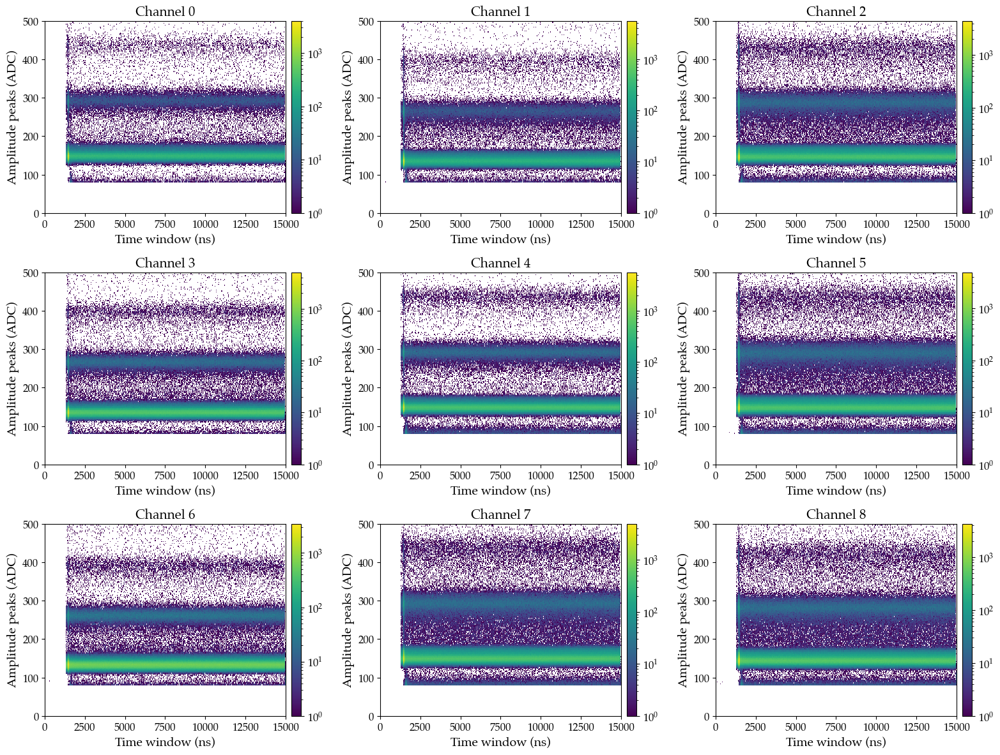

In [54]:
sel_dates = idx_thr_pt_hl_pv.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_thr_pt_hl_pv  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

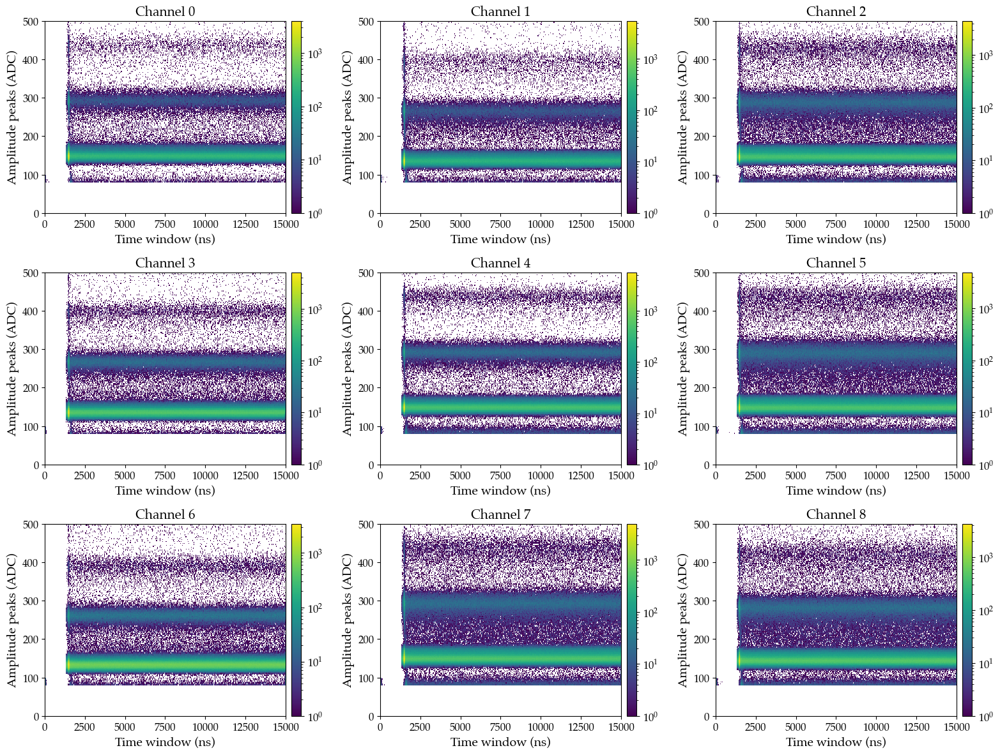

In [55]:
sel_dates = idx_max_pt_hl_pv.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_max_pt_hl_pv  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

6
3
0


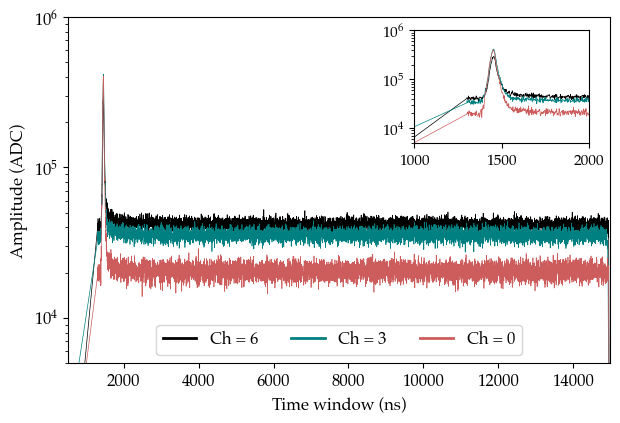

7
4
1


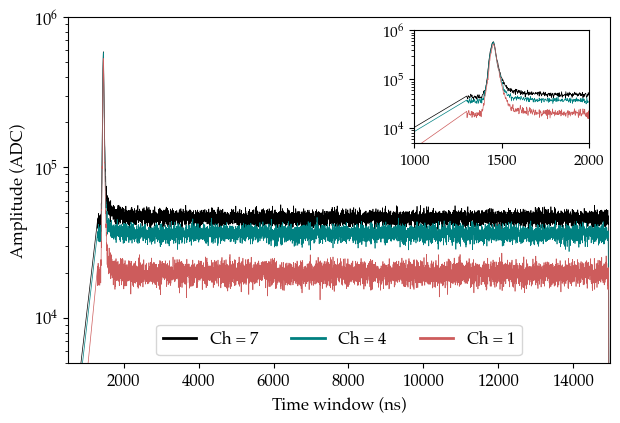

8
5
2


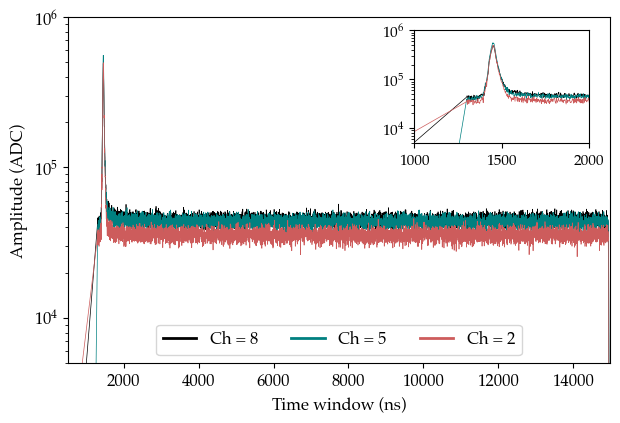

In [56]:
sel_dates = idx_thr_pt_hl_pv.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_thr_pt_hl_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',  fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(5e3, 1e6)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_thr_pt_hl_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)

    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(5e3, 1e6)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

6
3
0


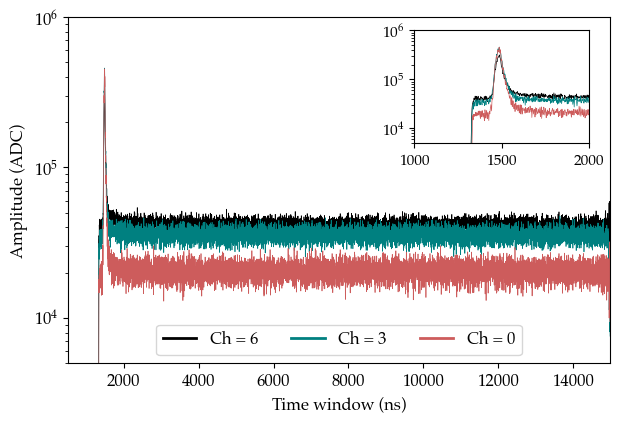

7
4
1


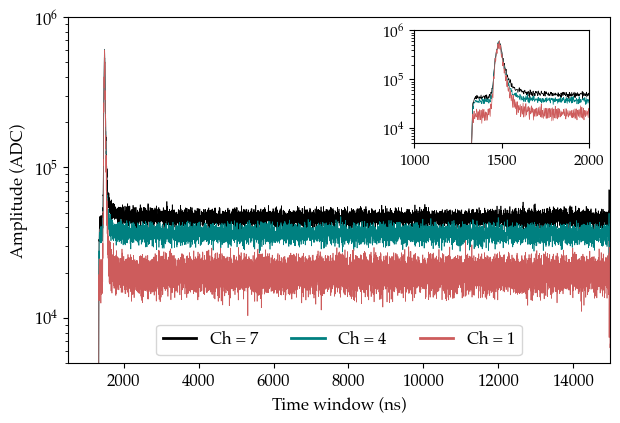

8
5
2


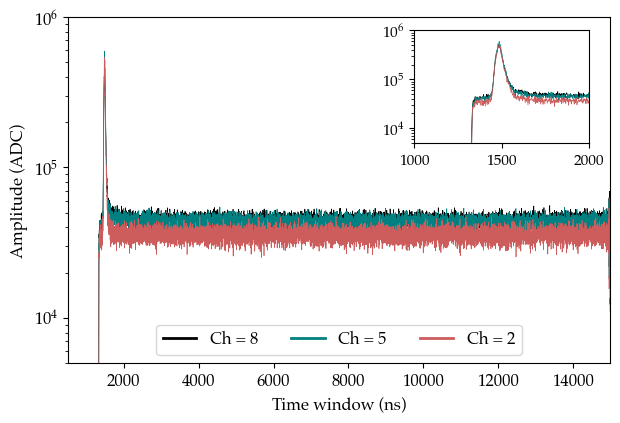

In [57]:
sel_dates = idx_max_pt_hl_pv.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_max_pt_hl_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',  fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(5e3, 1e6)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_max_pt_hl_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_pt_hl_pv[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)

    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(5e3, 1e6)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

### Add PMT rejection to SiPM data alla LLAMA

In [58]:
start_time = time.time()

filt_evts_dict_1pe = {}
idx_thr_1pe        = {}
height_sg_1pe      = {}

print(len(sorted_files2))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)

    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    try:
        d2 = np.load(evts_path + f'BACoN_pmt_analysis_hits_run-{date}-file_{fnum}.npz', allow_pickle=True)
    except:
        continue
    
    all_evts       = np.concatenate(list(d['filt_evts_dict'].item().values()))
    uniq_evts, cts = np.unique(all_evts, return_counts=True)
    uniq_evts_arr  = uniq_evts[cts == 1] ## Multiplicity cut between SiPMs
    
    pmt_evts = d2['non_zero_evts']
    pmt_idxs = d2['idx_peaks_pmt']
    pmt_heis = d2['h_peaks_pmt']
    
    ##PMT prompt evts
    condition   = np.array([np.any((idx_vals>int(1440/2)) & (idx_vals<int(1510/2))) for idx_vals in pmt_idxs])
    prompt_evts = pmt_evts[np.where(condition)[0]]
    
    ##Muon evts
    condition2 = np.array([np.any(h_vals>5000) for h_vals in pmt_heis])
    muon_evts  = pmt_evts[np.where(condition2)[0]]
    
    evts_to_remove = np.concatenate((prompt_evts, muon_evts))
    
    for ch in normal_chs:
        
        npeak_wf = np.array([len(el) for el in d['idx_peaks_thr'].item()[ch]])
        sel1     = np.isin(d['filt_evts_dict'].item()[ch], uniq_evts_arr)
        sel2     = npeak_wf==1
        if len(sel1)==0 or len(sel2)==0:
            continue
            
        sel_evts =                d['filt_evts_dict'] .item()[ch][sel1&sel2]
        indices1 = np.concatenate(d['idx_peaks_thr']  .item()[ch][sel1&sel2]).astype(int)
        heights1 = np.concatenate(d['height_peaks_sg'].item()[ch][sel1&sel2])
        
        sel3     = heights1 < 200 #amplitude < 200 ADC to select only single PE
        sel_evts = sel_evts[sel3]
        indices1 = indices1[sel3]
        heights1 = heights1[sel3]
        
        mask = ~np.isin(sel_evts, evts_to_remove)
        sel_evts = sel_evts[mask]
        indices1 = indices1[mask]
        heights1 = heights1[mask]        
    
        if date not in filt_evts_dict_1pe:
            filt_evts_dict_1pe[date] = {}
            idx_thr_1pe       [date] = {}
            height_sg_1pe     [date] = {}

        else:
            if ch not in filt_evts_dict_1pe[date]:
                try:
                    filt_evts_dict_1pe[date][ch] = sel_evts
                    idx_thr_1pe       [date][ch] = indices1
                    height_sg_1pe     [date][ch] = heights1
                except Exception as e:
                    print(e)
                    continue
                    
            else:
                try:
                    filt_evts_dict_1pe[date][ch] = np.concatenate((filt_evts_dict_1pe[date][ch], sel_evts))
                    idx_thr_1pe       [date][ch] = np.concatenate((idx_thr_1pe       [date][ch], indices1))
                    height_sg_1pe     [date][ch] = np.concatenate((height_sg_1pe     [date][ch], heights1))
                except Exception as e:
                    print(e)
                    continue
                
end_time     = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1380
0
20
40
60
80
100
120
140
160
180
200
220
240
260
280
300
320
340
360
380
400
420
440
460
480
500
520
540
560
580
600
620
640
660
680
700
720
740
760
780
800
820
840
860
880
900
920
940
960
980
1000
1020
1040
1060
1080
1100
1120
1140
1160
1180
1200
1220
1240
1260
1280
1300
1320
1340
1360
Elapsed time: 1268.7291190624237 s, 21.145485317707063 min


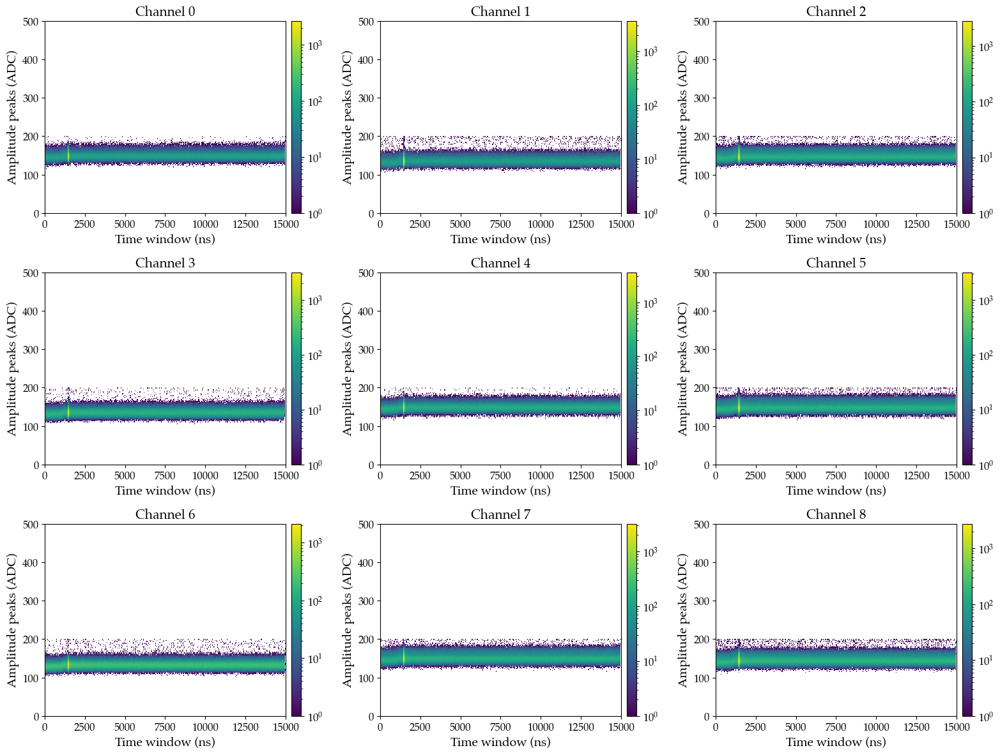

In [59]:
sel_dates = idx_thr_1pe.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_thr_1pe  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_1pe[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

6
3
0


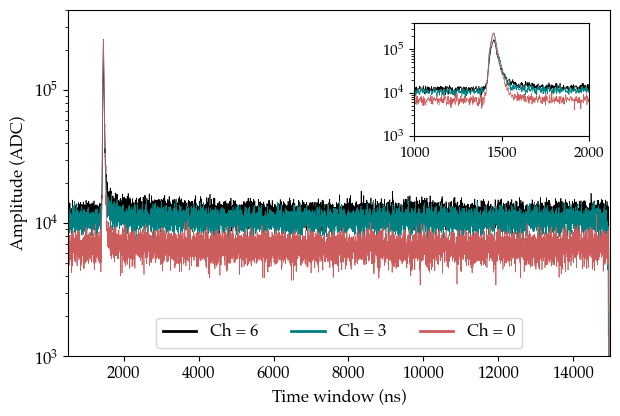

7
4
1


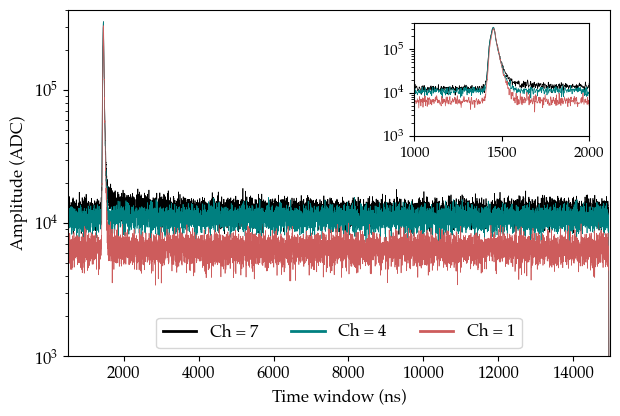

8
5
2


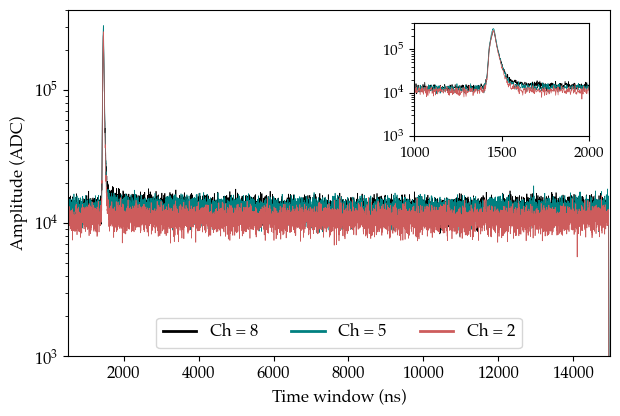

In [60]:
sel_dates = idx_thr_1pe.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_thr_1pe  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_1pe[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(1e3, 4e5)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_thr_1pe  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_1pe[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)

    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(1e3, 4e5)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()

## Same analyses with the deconv data

In [61]:
filt_files2   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_run-*')
sorted_files2 = sorted(filt_files2, key=extract_date_obj_and_number)

In [62]:
start_time = time.time()

idx_thr_d_pv   = {} # pmt veto (pv)
height_sg_d_pv = {}
num_evts_d_pv  = {}

print(len(sorted_files2))
for ifile,filename in enumerate(sorted_files2):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    try:
        d2 = np.load(evts_path + f'BACoN_pmt_analysis_hits_run-{date}-file_{fnum}.npz', allow_pickle=True)
    except:
        continue

    pmt_evts = d2['non_zero_evts']
    pmt_idxs = d2['idx_peaks_pmt']
    pmt_heis = d2['h_peaks_pmt']
    
    ##PMT prompt evts
    condition1  = np.array([np.any((idx_vals>int(1440/2)) & (idx_vals<int(1510/2))) for idx_vals in pmt_idxs])
    prompt_evts = pmt_evts[np.where(condition1)[0]]
    
    ##Muon evts
    condition2 = np.array([np.any(h_vals>5000) for h_vals in pmt_heis])
    muon_evts  = pmt_evts[np.where(condition2)[0]]

    for ch in normal_chs:
        idx_after_cut    = []
        height_after_cut = []
        num_evts         = 0
        filt_evts_num    = d['filt_evts_dict']        .item()[ch]
        idx_peaks_ch     = d['idx_peaks_thr']         .item()[ch]
        height_peaks_ch  = d['height_peaks_sg_deconv'].item()[ch]
        
        for evt_n, idxs, vals in zip(filt_evts_num, idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            if evt_n in prompt_evts:
                continue
            if evt_n in muon_evts:
                continue
            idx_after_cut   .append(idxs)
            height_after_cut.append(vals)
            num_evts += 1
                
        if date not in idx_thr_d_pv:
            print(date)
            idx_thr_d_pv  [date] = {}
            height_sg_d_pv[date] = {}
            num_evts_d_pv [date] = {}
            
        else:

            if ch not in idx_thr_d_pv[date]:
                try:
                    idx_thr_d_pv  [date][ch] = np.concatenate(idx_after_cut)
                    height_sg_d_pv[date][ch] = np.concatenate(height_after_cut)
                    num_evts_d_pv [date][ch] = np.array([num_evts])
                except Exception as e:
                    print(e)
                    continue
            else:
                try:
                    idx_thr_d_pv  [date][ch] = np.concatenate((idx_thr_d_pv  [date][ch], np.concatenate(idx_after_cut)))
                    height_sg_d_pv[date][ch] = np.concatenate((height_sg_d_pv[date][ch], np.concatenate(height_after_cut)))
                    num_evts_d_pv [date][ch] = np.concatenate((num_evts_d_pv [date][ch], np.array([num_evts])))
                except Exception as e:
                    print(e)
                    continue

end_time     = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} s, {elapsed_time/60} min")

1380
0
09_10_2024
09_11_2024
20
40
09_12_2024
60
09_20_2024
80
100
120
140
160
09_25_2024
180
200
220
09_28_2024
240
260
280
10_04_2024
300
320
340
360
10_11_2024
380
400
420
440
460
10_17_2024
480
500
520
540
560
10_25_2024
580
600
620
640
11_01_2024
660
680
700
720
11_11_2024
740
760
780
800
820
11_25_2024
840
860
880
900
920
12_13_2024
940
960
980
1000
1020
12_21_2024
1040
1060
1080
1100
01_02_2025
1120
1140
1160
1180
1200
01_10_2025
1220
1240
1260
1280
01_19_2025
1300
1320
1340
1360
Elapsed time: 374.8582887649536 s, 6.2476381460825605 min


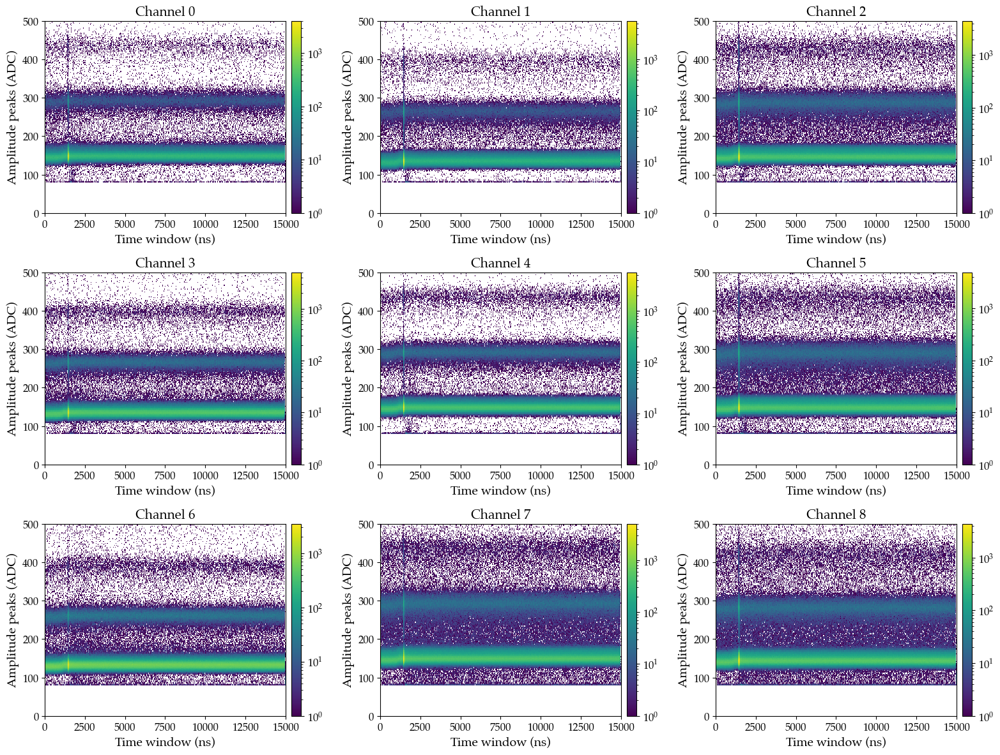

In [63]:
sel_dates = idx_thr_d_pv.keys()
fig, axs  = plt.subplots(3, 3, figsize=(16, 12))
for ch in normal_chs:
    i = int(ch/3)
    j = ch%3
    
    try:
        ch_idxs = np.concatenate([idx_thr_d_pv  [date][ch] for date in sel_dates])
        ch_vals = np.concatenate([height_sg_d_pv[date][ch] for date in sel_dates])
    
        fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 500)), cmin=1, norm=LogNorm())
        axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
        axs[i][j].set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        axs[i][j].set_title(f"Channel {ch}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
    except Exception as e:
        print(e)
        continue
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/hit_maps_pretrigg_and_high_light.pdf', bbox_inches='tight')
plt.show()

6
3
0


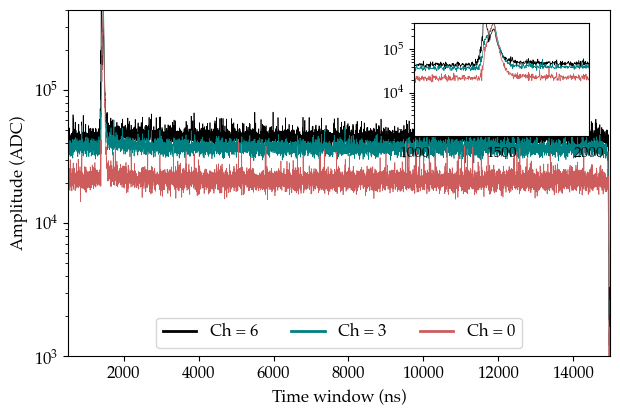

7
4
1


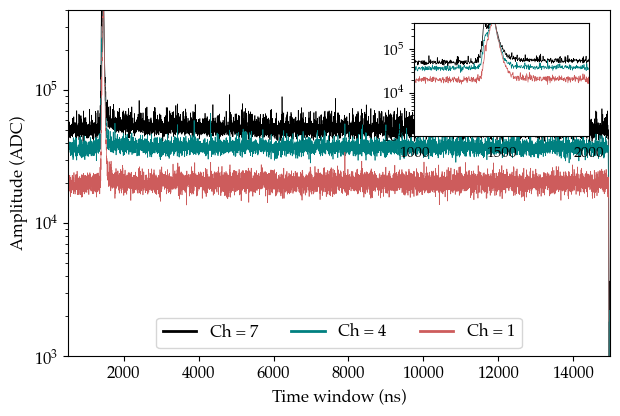

8
5
2


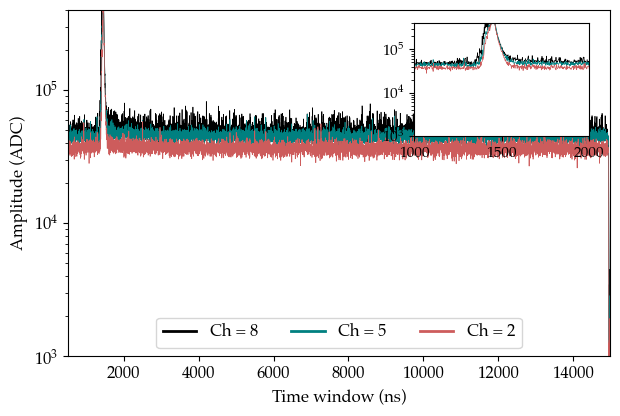

In [64]:
sel_dates = idx_thr_d_pv.keys()

for sel_chs in [[6, 3, 0], [7, 4, 1], [8, 5, 2]]:
    fig = plt.figure(figsize=(7, 4.5))
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        print(ch)
        timestamps = 2*np.concatenate([idx_thr_d_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_d_pv[date][ch] for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, c=col, label=f'Ch = {ch}')
        

    plt.xlabel('Time window (ns)', fontsize=12)
    plt.ylabel('Amplitude (ADC)',   fontsize=12)
    plt.yscale('log')
    plt.xlim(500, 15000)
    plt.ylim(1e3, 4e5)
    leg = plt.legend(loc='lower center', ncol=3)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
    for ch, col in zip(sel_chs, ['k', 'teal', 'indianred']):
        timestamps = 2*np.concatenate([idx_thr_d_pv  [date][ch] for date in sel_dates])
        amplitudes =   np.concatenate([height_sg_d_pv[date][ch] for date in sel_dates])
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
        ax_inset.plot(unique_timestamps, sum_amplitudes, c=col, lw=0.5)

    ax_inset.set_xlim(1000, 2000)
    ax_inset.set_ylim(1e3, 4e5)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    #plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/t_dist_pretrigg_and_high_light_chs_{sel_chs[0]}_{sel_chs[1]}_{sel_chs[2]}.pdf', bbox_inches='tight')
    plt.show()